# Coursera Capstone Project

## The Battle of Neighborhoods - Final Report (Week 2)

## Cristina M. B.


### Upload Libraries Required

In [5]:
import numpy as np # library to handle data in a vectorized manner
import time
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe


!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
from folium import plugins

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

import seaborn as sns

# import k-means from clustering stage
from sklearn.cluster import KMeans


print('Libraries imported.')

Libraries imported.


### Content

1.	Introduction Section : 
	
    1.1 Discussion of the "backgroung situation" leading to the problem at hand:
    
    1.2 Problem to be resolved
    
    1.3 Audience for this project.
    
    
2.	Data Section:  

	2.1 Data of Current Situation (current residence place)
    
    2.2 Data required to resolve the problem
    
    2.3 Data sources and data manipulation
    
    
3.	Methodology section : 

	3.1 Process steps and strategy to resolve the problem
    
    3.2 Data Science Methods, machine learing, mapping tools and exploratory data analysis.
    
    
4.	Results section 

	Discussion of the results and how they help to take a decision.
    
    
5.	Discussion section 

	Elaboration and discussion on any observations and/or recommendations for improvement.
    
    
6.	Conclusion section 

	Desicison taken and Report Conclusion.

# 1.	Introduction Section : 
### Discussion of the business problem and the audience who would be interested in this project.


### 1.1 Scenario and  Background

I am a data scientist currently residing in the Eixample (Barcelona - Spain). 
I currently live within walking distance to Sagrada Familia "Sant Pau | Dos de Maig metro station" therefore I have access to good public transportation to work. Likewise, I enjoy many ammenities in the neighborhood , such as international cousine restaurants, cafes, food shops and entertainment.
I have been offered a great opportunity to work in Madrid, Spain. Although, I am very excited about it, I am a bit stress toward the process to secure a comparable place to live in Madrid. Therefore, I decided to apply the learned skills during the Coursera course to explore ways to make sure my decision is factual and rewarding.
Of course, there are alternatives to achieve the answer using available Google and Social media tools, but it rewarding doing it myself with learned tools.   

### 1.2  Problem to be resolved:   

The challenge to resolve is being able to find a rental apartment unit in Madrid Spain that offers similar characteristics and benefits to my current situation. Therefore, in order to set a basis for comparison, I want to find a renta unit subject to the following conditions: 
- Apartment with monthly rent not to exceed 950 €/month
- Unit located within walking distance (1 km) from a subway metro station in Madrid
- Area with ammenities and venues similar to the ones described for current location ( See item 2.1)

### 1.3 Interested Audience
I believe this is a relevant project for a person or entity considering moving to a major city in Europe, US or Asia, since the approach and methodologies used here are applicable in all cases. The use of FourSquare data and mapping techniques combined with data analysis will help resolve the key questions arisen. Lastly, this project is a good practical case toward the development of Data Science skills.


# 2. Data Section:
### Description of the data and its sources that will be used to solve the problem

### 2.1 Data of Current Situation
I Currently reside in the neighborhood of 'Sagrada Familia' in Eixample Barcelona. 
I use Foursquare to identify the venues around the area of residence which are then shown in the Barcelona map shown in methodology and execution in section 3.0 . It serves as a reference for comparison with the desired future location in Madrid, Spain.

### 2.2 Data Required to resolve the problem
In order to make a good choice of a similar neighborhood in Madrid, the following data is required:
List/Information on neighborhoods form Madrid with their Geodata (latitude and longitude).
List/Information about the subway metro stations in Madrid with geodata.
List/Information of rent prices including locations.
Venues and ammenities in the Madrid neighborhoods (e.g. top 10)
### 2.3 sources and manipulation
The list of Madrid neighborhoods and rent prices by districts are obtained based on data obtained from the Madrid Open Data Platform (
<a href="https://www.madrid.es/portales/munimadrid/es/Inicio/El-Ayuntamiento/Estadistica/Distritos-en-cifras/?vgnextfmt=default&vgnextchannel=27002d05cb71b310VgnVCM1000000b205a0aRCRD">Madrid Neighborhoods info</a>).

df_neigh.head():

              COD_DIS    COD_BAR    CENTROID    Latitude    Longitude    NOMBRE

          0    17    172    (40.34088799078875, -3.688371579197298)    40.3409    -3.68837    San Cristobal

          1    17    173    (40.33711488700938, -3.676254238025643)    40.3371 	-3.67625 	Butarque

          2    17    175    (40.35579042948162, -3.699136963903404)    40.3558 	-3.69914 	Los Ángeles

          3    17    174    (40.35569711292909, -3.688489329452058)    40.3557 	-3.68849 	Los Rosales

          4    17    171    (40.34144808026994, -3.708948525264152)    40.3414 	-3.70895 	Villaverde Alto, Casco

prices.head():

          COD_DIS 	NOM_DIS 	date 	month 	year 	price

          0 	1 	Centro 	Nov 01 2020 	11 	2020 	17.1

          1 	1 	Centro 	Oct 01 2020 	10 	2020 	17.5

          2 	1 	Centro 	Sep 01 2020 	9 	2020 	17.8

          3 	1 	Centro 	Aug 01 2020 	8 	2020 	17.9

          4 	1 	Centro 	Jul 01 2020 	7 	2020 	18.0
          
          
A list of Madrid subway metro stops was obtained based on data from the 'Consorcio de Transportes de Madrid': <a href="https://data-crtm.opendata.arcgis.com/datasets/m4-accesos/data?geometry=-4.972%2C40.238%2C-2.352%2C40.604">Madrid Metro stations</a>


metro_shp.head():

       OBJECTID 	IDACCESO 	FECHAACTUA 	MODO 	CODIGOESTA 	CODIGOACCE 	CODIGOAC_1 	DENOMINACI 	OBSERVACIO 	NIVEL 	... 	FECHAFIN 	DISTANCIAA 	X 	Y 	IDFESTACIO 	IDFVESTIBU 	coords_xy 	latitude 	longitude 	coords

      0 	1 	4_11_39 	20150709 	4 	11 	39 	011113 	Fuencarral 		0 	... 			440571.442 	4474832.969 	4_11 	4_11_22 	[[440462.0011999998, 4474625.479800001]] 	440462.0012 	4.474625e+06 	(40.42012828984801, -3.701812611628674)

      1 	2 	4_11_40 	20150709 	4 	11 	40 	011114 	Montera 		0 	... 			440582.982 	4474763.852 	4_11 	4_11_22 	[[440473.5398000004, 4474556.3618]] 	440473.5398 	4.474556e+06 	(40.41950646789212, -3.70167013920818)

      2 	3 	4_12_41 	20150709 	4 	12 	41 	011211 	Carretas 		0 	... 			440422.484 	4474447.644 	4_12 	4_12_23 	[[440313.0393000003, 4474240.1544]] 	440313.0393 	4.474240e+06 	(40.4166464264634, -3.7035322359826868)

      3 	4 	4_12_42 	20150709 	4 	12 	42 	011212 	Carmen 		0 	... 			440443.262 	4474501.791 	4_12 	4_12_23 	[[440333.8178000003, 4474294.301000001]] 	440333.8178 	4.474294e+06 	(40.41713569455122, -3.7032924156859264)

      4 	5 	4_12_43 	20150709 	4 	12 	43 	011231 	Mayor 		0 	... 			440333.351 	4474455.010 	4_12 	4_12_25 	[[440223.90699999966, 4474247.521400001]] 	440223.9070 	4.474248e+06 	(40.416706394551824, -3.7045834584598447)
     

The list of Barcelona neighborhoods are obtained based on data obtained from the Barcelona Open Data Platform (
<a href="https://opendata-ajuntament.barcelona.cat/data/es/organization/entorn-urba">Barcelona Neighborhoods info</a>).

gdf_bcn.head():

              NOMBRE 	latitude 	longitude

          11 	el Raval 	41.378999 	2.170437

          12 	el Barri Gòtic 	41.381292 	2.177312

          13 	la Barceloneta 	41.377684 	2.190148

          14 	Sant Pere_ Santa Caterina i la Ribera 	41.386795 	2.183431

          15 	el Fort Pienc 	41.397406 	2.181499

A list of Barcelona subway metro stations is obtained based on data from the developer portal of the TMB (Transports of Barcelona): <a href="https://developer.tmb.cat/data/estacions">Barcelona Metro stations</a>

gdf_metro.head():

              id 	CODI_GRUP_ESTACIO 	NOM_ESTACIO 	PICTO 	DATA 	geometry

          0 	ESTACIONS.6660111 	6660111 	Hospital de Bellvitge 	L1 	2020-12-04 	POINT (2.10724 41.34468)

          1 	ESTACIONS.6660112 	6660112 	Bellvitge 	L1 	2020-12-04 	POINT (2.11092 41.35097)

          2 	ESTACIONS.6660113 	6660113 	Av. Carrilet 	L1 	2020-12-04 	POINT (2.10264 41.35852)

          3 	ESTACIONS.6660114 	6660114 	Rambla Just Oliveras 	L1 	2020-12-04 	POINT (2.09975 41.36409)

          4 	ESTACIONS.6660115 	6660115 	Can Serra 	L1 	2020-12-04 	POINT (2.10276 41.36769)


### 2.4 How the data will be used to solve the problem
The data will be used as follows:
Use Foursquare and geopy data to map top 10 venues for all Madrid neighborhoods and clustered in groups ( as per Course LAB)
Use foursquare and geopy data to map the location of subway metro stations , separately and on top of the above clustered map in order to be able to identify the venues and ammenities near each metro station, or explore each subway location separately.
Use Foursquare and geopy data to map top 10 venues for current Barcelona neighborhood and clustered in groups (as per Course LAB)
Compare current home location in Barcelona with Madrid neighborhoods and use prices and metro distance to find a suitable location to move in Madrid.

### 2.5 Mapping of Data
The following maps were created to facilitate the analysis and the choice of the place to live.
- Madrid map of Neighborhoods
- Madrid subway metro locations
- Madrid map of rent prices
- Madrid map of clustered venues and neighborhoods (TBD on Week 2)
- Barcelona map of Neighborhoods
- Barcelona subway metro locations
- Barcelona map of venues around current street (TBD on Week 2)

In [3]:
!pip install geojson

In [4]:
#load data from Barrios.kml
#create a dataframe with the data
import pandas as pd
import xml.etree.ElementTree as ET
import geojson
tree = ET.parse("/home/cris/Data/MAD/Barrios.kml")
root = tree.getroot()

barr = []
barrios = pd.DataFrame(columns = ['ID', 'CODDIS', 'NOMDIS', 'CODBAR', 'NOMBRE', 'coordinates','CENTROID','latitude', 'longitude',
                                 'geometry_lats', 'geometry_longs'])

ID = []
CODDIS = []
NOMDIS = []
CODBAR = []
NOMBRE = []
COORDINATES = []
PlaceMarks = tree.findall('.//{http://www.opengis.net/kml/2.2}Placemark')

for PlaceMark in PlaceMarks:
    for vals in PlaceMark:
        if vals.tag == '{http://www.opengis.net/kml/2.2}name':
            ID.append(vals.text)
    for PlaceData in PlaceMark:
        if PlaceData.tag == '{http://www.opengis.net/kml/2.2}ExtendedData':
            for ExtendedData in PlaceData:
                  if ExtendedData.tag == '{http://www.opengis.net/kml/2.2}SchemaData':
                        #print(dataR.tag, dataR.text)
                        i = 0
                        for Data in ExtendedData:
                            if Data.tag == '{http://www.opengis.net/kml/2.2}SimpleData':
                                if i == 3:
                                    CODDIS.append(Data.text)
                                if i == 4:
                                    NOMDIS.append(Data.text)                                    
                                if i == 5:
                                    CODBAR.append(Data.text)
                                if i == 8:
                                    NOMBRE.append(Data.text)
                                i = i + 1
        else:
            if PlaceData.tag == '{http://www.opengis.net/kml/2.2}LineString':      
                #lineStrings = tree.findall('.//{http://www.opengis.net/kml/2.2}LineString')
                for lineStrings in PlaceData:
                        coord_tx = ""
                        if lineStrings.tag == '{http://www.opengis.net/kml/2.2}coordinates':                            
                            COORDINATES.append(lineStrings.text)

barrios['ID'] = ID
barrios['CODDIS'] = CODDIS
barrios['NOMDIS'] = NOMDIS
barrios['CODBAR'] = CODBAR
barrios['NOMBRE'] = NOMBRE
barrios['coordinates'] = COORDINATES

barrios.head()

,ID,CODDIS,NOMDIS,CODBAR,NOMBRE,coordinates,CENTROID,latitude,longitude,geometry_lats,geometry_longs
0,kml_1,17,Villaverde,171,San Andrés,"-3.69255031751288,40.3327329748109,0.0 -3.6925...",NaN,NaN,NaN,NaN,NaN
1,kml_2,17,Villaverde,171,San Andrés,"-3.69296796182375,40.3458476071284,0.0 -3.6929...",NaN,NaN,NaN,NaN,NaN
2,kml_3,17,Villaverde,172,San Cristobal,"-3.68379091375413,40.3502149555978,0.0 -3.6837...",NaN,NaN,NaN,NaN,NaN
3,kml_4,17,Villaverde,172,San Cristobal,"-3.69296796182375,40.3458476071284,0.0 -3.6924...",NaN,NaN,NaN,NaN,NaN
4,kml_5,17,Villaverde,173,Butarque,"-3.68379091375413,40.3502149555978,0.0 -3.6836...",NaN,NaN,NaN,NaN,NaN


In [5]:
!pip install shapely

In [6]:
# Create dataframe with unique Neighborhoods by CODBAR and join coordinates from several rows:
# Find the centroid of the polygons
# Just for learning purposes: The content of the shp file does not match the content of the kml file
# kml file has lines with coordinates and several rows (lines) for a neighborhood
# the shp file has a unique entry for each polygon and finally is the one that is used for creating
# the maps and the centroids of each neigborhood that will be used later on:
from shapely.geometry import Point, Polygon
import os
import geojson
import json
import folium
BAR = barrios.CODBAR.unique()
BARu = pd.DataFrame()
for k in range(0, len(BAR)):
    filter1 = barrios['CODBAR'].str.contains(BAR[k])
    BARx = barrios.where(filter1)
    BARx = BARx.dropna(subset=['CODBAR'])
    c = 0
    for item, row in BARx.iterrows():
        if c > 0:
            val = BARu.iloc[k, BARu.columns.get_loc('coordinates')]
            BARu['coordinates'][k] = val
        else:
            BARu = BARu.append(row, ignore_index = True)
        c = c + 1
        
for j in range(0, BARu.shape[0]):
    test_str = BARu['coordinates'][j].split()
    L1 = []
    for item in test_str:
        L1.append(tuple(map(float, item.split(','))))
    if len(L1) > 2:
        Poly = Polygon(L1)
        centroid = Poly.centroid.wkt 
        centroid = centroid.strip('POINT ')
        coord_cent = tuple(float(s) for s in centroid.strip('()').split())
        BARu['CENTROID'][j] = str(coord_cent)
        BARu['latitude'][j] = coord_cent[1]
        BARu['longitude'][j] = coord_cent[0]
    BARu['coordinates'][j] = L1
        
BARu.dropna(subset = ["CENTROID"], inplace=True)
BARu.head(20)

<ipython-input-6-21a84a2c9ac7>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BARu['coordinates'][k] = val
<ipython-input-6-21a84a2c9ac7>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BARu['CENTROID'][j] = str(coord_cent)
/home/cris/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-6-21a84a2c9ac7>:38: SettingW

,CENTROID,CODBAR,CODDIS,ID,NOMBRE,NOMDIS,coordinates,geometry_lats,geometry_longs,latitude,longitude
0,"(-3.692382528831878, 40.32602834023368)",171,17,kml_1,San Andrés,Villaverde,"[(-3.69255031751288, 40.3327329748109, 0.0), (...",NaN,NaN,40.326028,-3.692383
1,"(-3.686902710287918, 40.33963970553078)",172,17,kml_3,San Cristobal,Villaverde,"[(-3.68379091375413, 40.3502149555978, 0.0), (...",NaN,NaN,40.339640,-3.686903
2,"(-3.682738807562266, 40.35570739056374)",173,17,kml_5,Butarque,Villaverde,"[(-3.68379091375413, 40.3502149555978, 0.0), (...",NaN,NaN,40.355707,-3.682739
3,"(-3.693393760809281, 40.35635347972158)",174,17,kml_7,Los Rosales,Villaverde,"[(-3.69296796182375, 40.3458476071284, 0.0), (...",NaN,NaN,40.356353,-3.693394
4,"(-3.703856489837063, 40.36827587866663)",121,12,kml_8,Orcasitas,Usera,"[(-3.70345290207178, 40.3711566911761, 0.0), (...",NaN,NaN,40.368276,-3.703856
5,"(-3.728102792594974, 40.37362018868426)",116,11,kml_11,Buenavista,Carabanchel,"[(-3.73644220097911, 40.3738578518829, 0.0), (...",NaN,NaN,40.373620,-3.728103
6,"(-3.653185987065763, 40.37603187886067)",131,13,kml_12,Entrevías,Puente de Vallecas,"[(-3.65438425624249, 40.3760307063046, 0.0), (...",NaN,NaN,40.376032,-3.653186
7,"(-3.745365761004323, 40.37417313894274)",115,11,kml_13,Puerta Bonita,Carabanchel,"[(-3.73644220097911, 40.3738578518829, 0.0), (...",NaN,NaN,40.374173,-3.745366
8,"(-3.701694190890513, 40.3757713509958)",122,12,kml_14,Orcasur,Usera,"[(-3.70345290207178, 40.3711566911761, 0.0), (...",NaN,NaN,40.375771,-3.701694
9,"(-3.753831417736014, 40.37731471746606)",114,11,kml_15,Vista Alegre,Carabanchel,"[(-3.75079138165851, 40.3758268755965, 0.0), (...",NaN,NaN,40.377315,-3.753831


In [6]:
!pip install geopandas

     |████████████████████████████████| 962 kB 12 kB/s eta 0:00:011
     |████████████████████████████████| 14.7 MB 62 kB/s eta 0:00:014     |█████████▊                      | 4.5 MB 32 kB/s eta 0:05:20
     |████████████████████████████████| 6.5 MB 60 kB/s eta 0:00:015


In [7]:
#Creates the fields geometry_lats and geometry_longs extracted from kml
#and joined in a single row by BAR_COD
import geopandas as gpd
import shapely
for n, rowB in BARu.iterrows():
    #coord_t = str(rowB['coordinates'])
    #coord_t = coord_t.replace(',0.0','')
    
    coord_t = str(rowB['coordinates'])
    coord_t = coord_t.replace(', 0.0),','')
    coord_t = coord_t.replace('(','')
    coord_t = coord_t.replace(', 0.0)','')
    coord_t = coord_t.replace(', ',',')
    coord_t = coord_t.replace('[','')
    coord_t = coord_t.replace(']','')
    lats = []
    longs = []    
    
    for s in coord_t.split():
        var = s.split(',')
        lats.append(var[1])
        longs.append(var[0])

    BARu['geometry_lats'][n] = lats
    BARu['geometry_longs'][n] = longs
BARu.head()

var = barrios['coordinates'].to_list()


<ipython-input-7-77e39e22bc38>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BARu['geometry_lats'][n] = lats
/home/cris/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-7-77e39e22bc38>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BARu['geometry_longs'][n] = longs


In [5]:
!pip install pyshp

number of neighborhoods in Madrid: 131


<ipython-input-8-f1e54e8b39c8>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CENTROID'][item] = str(coord_cent)
<ipython-input-8-f1e54e8b39c8>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['latitude'][item] = coord_cent[0]
<ipython-input-8-f1e54e8b39c8>:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['longitude'][item] = coord_cent[1]


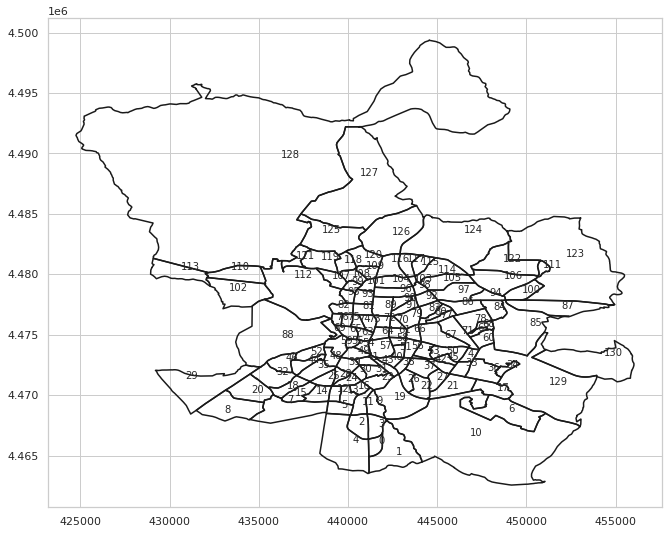

In [8]:
#load data from shp routine
#coordinates conversion
import numpy as np
import pandas as pd
import shapefile as shp
import matplotlib.pyplot as plt
import seaborn as sns
import pyproj #import Proj, transform
from pyproj import Transformer


sns.set(style='whitegrid', palette='pastel', color_codes=True)
sns.mpl.rc('figure', figsize=(10,6))

%matplotlib inline

myshp = open("/home/cris/Data/MAD/Barrios-MAD.shp", "rb")
mydbf = open("/home/cris/Data/MAD/Barrios-MAD.dbf", "rb")
r = shp.Reader(shp=myshp, dbf=mydbf)
sf = shp.Reader("/home/cris/Data/MAD/Barrios-MAD.dbf")

sf.shapeType
print('number of neighborhoods in Madrid:', len(sf))
shapes = sf.shapes()

def read_shapefile(sf):
    #Read a shapefile into a Pandas dataframe with a 'coords' 
    #column holding the geometry information. This uses the pyshp
    #package
    fields = [x[0] for x in sf.fields][1:]
    records = sf.records()
    shps = [s.points for s in sf.shapes()]
    df = pd.DataFrame(columns=fields, data=records)
    df = df.assign(coords=shps)
    return df

df = read_shapefile(sf)

df['coords_gps'] = '' 

def coordTrans(): 
#Once ran the result is stored into shapes.csv and the df 
    for item, row in df.iterrows():
        print('item ' + str(item) + ' of ' + str(df.shape[0]))
        coordinates = row['coords']
        coordinates_M = []
        for i in range(0, len(coordinates)):        
            x1, y1 = coordinates[i]
            transformer = Transformer.from_crs("epsg:25830", "epsg:4326")
            x2,y2 = transformer.transform(x1, y1)
            coordinates_gps = (x2, y2)
            coordinates_M.append(coordinates_gps)
        df.at[item,'coords_gps'] = coordinates_M

    df.rename(columns={"coords": "coords_xy", "coords_gps": "coords"})

def coordCentroid(df): 
#Once ran the result is stored into shapes.csv and the df
    df['CENTROID'] = ''
    df['latitude'] = ''
    df['longitude'] = ''
    for item, row in df.iterrows():       
        #test_str = df['coords'][j].split()        
        #
        textT = df['coords'][item]
        textT = textT.replace('), (', ' ')
        textT = textT.replace('[','')
        textT = textT.replace(']','')
        textT = textT.replace('(','')
        textT = textT.replace(')','')
        textT = textT.replace(', ',',')
        textT = textT.split(' ')
        textT
        coords = []
        L2 = []
        for s in textT:
            coords = []
            for s2 in s.split(','):
                coords.append(float(s2))                
                
            L2.append(tuple(coords))
            lat = coords[0]
            long = coords[1]
        if len(L2) > 2:
            Poly = Polygon(L2)
       
        centroid = Poly.centroid.wkt 
        centroid = centroid.strip('POINT ')
        coord_cent = tuple(float(s) for s in centroid.strip('()').split())
        df['CENTROID'][item] = str(coord_cent)
        df['latitude'][item] = coord_cent[0]
        df['longitude'][item] = coord_cent[1]
        
#This plot_map works for coordinates x, y
def plot_map(sf, x_lim = None, y_lim = None, figsize = (11,9)):
    '''
    Plot map with lim coordinates
    '''
    plt.figure(figsize = figsize)
    id=0
    for shape in sf.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]
        y = [i[1] for i in shape.shape.points[:]]
        plt.plot(x, y, 'k')
        
        if (x_lim == None) & (y_lim == None):
            x0 = np.mean(x)
            y0 = np.mean(y)
            plt.text(x0, y0, id, fontsize=10)
        id = id+1
    
    if (x_lim != None) & (y_lim != None):     
        plt.xlim(x_lim)
        plt.ylim(y_lim)

#once we have the coordinates conversed we load the csv file:
df = pd.read_csv('/home/cris/Data/MAD/shapes.csv')
df = df.rename(columns={"coords": "coords_xy", "coords_gps": "coords"})
coordCentroid(df)

plot_map(sf)

In [173]:
df.head()

,Unnamed: 0,OBJECTID_1,NOMDIS,NOMBRE,Shape_Leng,Shape_Area,COD_DIS,COD_DIS_TX,BARRIO_MAY,COD_DISBAR,COD_BAR,NUM_BAR,BARRIO_MT,COD_DISB,coords_xy,coords,CENTROID,latitude,longitude
0,0,1,Villaverde,San Cristóbal,4752.827446,1.082492e+06,17,17,SAN CRISTOBAL,172,172,2,SAN CRISTOBAL,17-2,"[(441930.8669999996, 4466853.188999999), (4419...","[(40.350214958848454, -3.6837909114265264), (4...","(40.34088799078875, -3.688371579197298)",40.3409,-3.68837
1,1,2,Villaverde,Butarque,12641.916858,6.375522e+06,17,17,BUTARQUE,173,173,3,BUTARQUE,17-3,"[(444144.85699999984, 4464473.210999999), (443...","[(40.32892568851315, -3.657513632638966), (40....","(40.33711488700938, -3.676254238025643)",40.3371,-3.67625
2,2,3,Villaverde,Los Ángeles,5703.998815,1.935271e+06,17,17,LOS ANGELES,175,175,5,LOS ÁNGELES,17-5,"[(441147.7280000001, 4466374.482999999), (4411...","[(40.34584760405907, -3.6929679617869082), (40...","(40.35579042948162, -3.699136963903404)",40.3558,-3.69914
3,3,4,Villaverde,Los Rosales,5470.262628,1.540747e+06,17,17,LOS ROSALES,174,174,4,LOS ROSALES,17-4,"[(442098.82600000035, 4468081.978), (442132.05...","[(40.36129631270684, -3.6819247614159774), (40...","(40.35569711292909, -3.688489329452058)",40.3557,-3.68849
4,4,5,Villaverde,"Villaverde Alto, Casco Histórico de Villaverde",13726.660503,9.253554e+06,17,17,"VILLAVERDE ALTO, CASCO HISTORICO DE VILLAVERDE",171,171,1,"VILLAVERDE ALTO, CASCO HISTÓRICO DE VILLAVERDE",17-1,"[(440129.2759999996, 4468362.078), (440048.481...","[(40.36368051975808, -3.7051455765740116), (40...","(40.34144808026994, -3.708948525264152)",40.3414,-3.70895


In [9]:
#Create map with centroids by neighborhoods in Madrid
import os
import geojson
import json
import folium

def data2geojson(df):
    features = []
    insert_features = lambda X: features.append(
            geojson.Feature(geometry=geojson.Point((X["longitude"],
                                                    X["latitude"],
                                                    0)),
                            properties=dict(name=X["name"],
                                            description=X["description"])))
    df.apply(insert_features, axis=1)
    with open('/home/cris/Data/MAD/map_metro.geojson', 'w', encoding='utf8') as fp:
        geojson.dump(geojson.FeatureCollection(features), fp, sort_keys=True, ensure_ascii=False)

#Create GeoJson for Folium map based on information from kml
#data2geojson(BARu)

with open('/home/cris/Data/MAD/map1.geojson') as access_json:
    read_content = json.load(access_json)

feature_access = read_content['features']

# Creating Folium Map
meanLat = BARu['latitude'].mean()
meanLong = BARu['longitude'].mean()
m_districts = folium.Map(location=[meanLat, meanLong], zoom_start=12)
nodeData = os.path.join('map1.geojson')
geo_json = folium.GeoJson(nodeData)

#add markers
for i, rec in df.iterrows():
    centroid_txt = rec['CENTROID']
    loc = tuple((float(rec['latitude']), float(rec['longitude'])))
    folium.Marker(location=(rec['latitude'], rec['longitude']),
                  popup = rec['NOMBRE']).add_to(m_districts)
    
geo_json.add_to(m_districts)
m_districts

In [170]:
BARu[['CODDIS','CODBAR', 'CENTROID', 'latitude', 'longitude', 'NOMBRE']]

,CODDIS,CODBAR,CENTROID,latitude,longitude,NOMBRE
0,17,171,"(-3.692382528831878, 40.32602834023368)",40.326028,-3.692383,San Andrés
1,17,172,"(-3.686902710287918, 40.33963970553078)",40.339640,-3.686903,San Cristobal
2,17,173,"(-3.682738807562266, 40.35570739056374)",40.355707,-3.682739,Butarque
3,17,174,"(-3.693393760809281, 40.35635347972158)",40.356353,-3.693394,Los Rosales
4,12,121,"(-3.703856489837063, 40.36827587866663)",40.368276,-3.703856,Orcasitas
...,...,...,...,...,...,...
122,Chamberí,Chamberí,"(-3.714916249061155, 40.44085874888523)",40.440859,-3.714916,0
123,Ciudad Lineal,Ciudad Lineal,"(-3.63750155641011, 40.43748388799573)",40.437484,-3.637502,0
124,San Blas - Canillejas,San Blas - Canillejas,"(-3.565553132627514, 40.44917509701223)",40.449175,-3.565553,0
125,Hortaleza,Hortaleza,"(-3.629925825022692, 40.4493097289977)",40.449310,-3.629926,0


In [10]:
df_neigh = df[['COD_DIS', 'COD_BAR', 'CENTROID', 'latitude', 'longitude', 'NOMBRE']]
df_neigh.head()

,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE
0,17,172,"(40.34088799078875, -3.688371579197298)",40.3409,-3.68837,San Cristóbal
1,17,173,"(40.33711488700938, -3.676254238025643)",40.3371,-3.67625,Butarque
2,17,175,"(40.35579042948162, -3.699136963903404)",40.3558,-3.69914,Los Ángeles
3,17,174,"(40.35569711292909, -3.688489329452058)",40.3557,-3.68849,Los Rosales
4,17,171,"(40.34144808026994, -3.708948525264152)",40.3414,-3.70895,"Villaverde Alto, Casco Histórico de Villaverde"


In [12]:
#Create the gjson with the poligons with data from df --> shp file
#def data2geojson_polygons(df):
coordsTot = []
features2 = []
Tot = []
for n, X in df.iterrows():
    coord_tx = df['coords'][n]
    coord_tx = coord_tx.replace('[','')
    coord_tx = coord_tx.replace(']','')
    coord_tx = coord_tx.replace('), (',') (')
    coord_tx = coord_tx.replace(', ',',')
    coord_tx = coord_tx.replace('(','')
    coord_tx = coord_tx.replace(')','')
    #coord_tx = coord_tx.split(' ')
    coord_tx
    coordsM = []
    #coords = tuple(float(s.split(','))
    for s in coord_tx.split(' '):
        #print(s)
        i = 0
        for m in s.split(','):
            if i == 0:
                coords1 = float(m)
                i = i + 1
            else:
                coords2 = float(m)
                coords = (coords2, coords1)
                coordsM.append(coords)

    Tot.append(coordsM)
    poly = Polygon(coordsM)
    dict1 = dict(name=X["COD_BAR"], description=X["BARRIO_MAY"])
    feature = geojson.Feature(geometry = poly, properties = dict1)
    features2.append(feature)

with open('/home/cris/Data/MAD/mapMAD.geojson', 'w', encoding='utf8') as fp:
    geojson.dump(geojson.FeatureCollection(features2), fp, sort_keys=True, ensure_ascii=False)

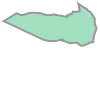

In [13]:
poly

In [14]:
#Using geojson previously created with polygons:
import json
import geopandas

barrios_geojson = geopandas.read_file('/home/cris/Data/MAD/mapMAD.geojson')

geo_json1 = folium.GeoJson(barrios_geojson)

# Creating Folium Map
meanLat = BARu['latitude'].mean()
meanLong = BARu['longitude'].mean()
m_neighborhoods = folium.Map(location=[meanLat, meanLong], zoom_start=10)

geo_json1.add_to(m_neighborhoods)

#add markers
for i, rec in df.iterrows():
    centroid_txt = rec['CENTROID']
    #loc = tuple(float(s) for s in centroid_txt.strip('()').split(','))
    loc = tuple((float(rec['latitude']), float(rec['longitude'])))
    #print(str(df['CENTROID'][i]))
    folium.Marker(location=(rec['latitude'], rec['longitude']),
                  popup = rec['NOMBRE']).add_to(m_neighborhoods)
    
m_neighborhoods

In [15]:
barrios_geojson = geopandas.read_file('/home/cris/Data/MAD/mapMAD.geojson')
barrios_geojson

,description,name,geometry
0,SAN CRISTOBAL,172,"POLYGON ((-3.68379 40.35021, -3.68379 40.34888..."
1,BUTARQUE,173,"POLYGON ((-3.65751 40.32893, -3.65991 40.32786..."
2,LOS ANGELES,175,"POLYGON ((-3.69297 40.34585, -3.69339 40.34579..."
3,LOS ROSALES,174,"POLYGON ((-3.68193 40.36130, -3.68152 40.36022..."
4,"VILLAVERDE ALTO, CASCO HISTORICO DE VILLAVERDE",171,"POLYGON ((-3.70515 40.36368, -3.70606 40.35983..."
5,ORCASITAS,121,"POLYGON ((-3.71232 40.37334, -3.71077 40.37293..."
6,ENSANCHE DE VALLECAS,183,"POLYGON ((-3.60070 40.37671, -3.60021 40.37582..."
7,BUENAVISTA,116,"POLYGON ((-3.75079 40.37583, -3.75077 40.37550..."
8,CUATRO VIENTOS,106,"POLYGON ((-3.76225 40.37262, -3.76294 40.36902..."
9,SAN FERMIN,123,"POLYGON ((-3.68193 40.36130, -3.68314 40.36173..."


In [17]:
#Neighborhood prices - https://datos.madrid.es/portal/site/egob/
#https://www.madrid.es/portales/munimadrid/es/Inicio/El-Ayuntamiento/Estadistica/Distritos-en-cifras
from datetime import datetime
prices_MAD_DIS = pd.DataFrame()
prices_MAD_DIS = pd.read_csv('/home/cris/Data/MAD/PRECIOS_DISCT_MAD.csv', sep=',', engine='python')
prices_MAD_DIS.head()
#
#transform the date columns per month into table with the foloowing 
prices = pd.DataFrame(columns=['COD_DIS', 'NOM_DIS', 'date', 'month', 'year', 'price'])
n1 = 0
nom_dis = []
cod_dis = []
dates = []
months = []
years = []
pricesT = []
for el, row in prices_MAD_DIS.iterrows():
    num = 0
    for dat in prices_MAD_DIS.columns:
        #print(row['NOM_DIS'])
        if num > 1:
            date_txt = dat
            date_price = datetime.strptime(date_txt, '%d/%m/%y')    
            month_price = date_price.month
            year_price = date_price.year
            #print(str(n1))
            #data = [{'COD_DIS':row['COD_DIS'],'NOM_DIS':row['NOM_DIS']}]
            nom_dis.append(row['NOM_DIS'])
            cod_dis.append(row['COD_DIS'])
            dates.append(date_price.strftime("%b %d %Y"))
            months.append(month_price)
            years.append(year_price)
            pricesT.append(row[date_txt])
            n1 = n1 + 1
        num = num + 1

prices = prices.assign(COD_DIS=cod_dis)
prices = prices.assign(NOM_DIS=nom_dis)
prices = prices.assign(date=dates)
prices = prices.assign(month=months)
prices = prices.assign(year=years)
prices = prices.assign(price=pricesT)
prices.head()

,COD_DIS,NOM_DIS,date,month,year,price
0,1,Centro,Nov 01 2020,11,2020,17.1
1,1,Centro,Oct 01 2020,10,2020,17.5
2,1,Centro,Sep 01 2020,9,2020,17.8
3,1,Centro,Aug 01 2020,8,2020,17.9
4,1,Centro,Jul 01 2020,7,2020,18.0


In [18]:
#get only the november 2020 data for the prices
filterdate = ((prices['month'] == 11) & (prices['year'] == 2020))
pricesToday = prices.where(filterdate)
pricesToday = pricesToday.dropna(subset=['COD_DIS'])
pricesToday.head()

,COD_DIS,NOM_DIS,date,month,year,price
0,1.0,Centro,Nov 01 2020,11.0,2020.0,17.1
23,2.0,Arganzuela,Nov 01 2020,11.0,2020.0,14.8
46,3.0,Retiro,Nov 01 2020,11.0,2020.0,14.8
69,4.0,Salamanca,Nov 01 2020,11.0,2020.0,15.3
92,5.0,Chamartín,Nov 01 2020,11.0,2020.0,15.3


In [19]:
for_plotting = barrios_geojson.merge(df, left_on = 'name', right_on = 'COD_BAR')
for_plotting = for_plotting.merge(pricesToday, left_on = 'COD_DIS', right_on = 'COD_DIS')
for_plotting.head()

,description,name,geometry,Unnamed: 0,OBJECTID_1,NOMDIS,NOMBRE,Shape_Leng,Shape_Area,COD_DIS,COD_DIS_TX,BARRIO_MAY,COD_DISBAR,COD_BAR,NUM_BAR,BARRIO_MT,COD_DISB,coords_xy,coords,CENTROID,latitude,longitude,NOM_DIS,date,month,year,price
0,SAN CRISTOBAL,172,"POLYGON ((-3.68379 40.35021, -3.68379 40.34888...",0,1,Villaverde,San Cristóbal,4752.827446,1.082492e+06,17,17,SAN CRISTOBAL,172,172,2,SAN CRISTOBAL,17-2,"[(441930.8669999996, 4466853.188999999), (4419...","[(40.350214958848454, -3.6837909114265264), (4...","(40.34088799078875, -3.688371579197298)",40.3409,-3.68837,Villaverde,Nov 01 2020,11.0,2020.0,10.8
1,BUTARQUE,173,"POLYGON ((-3.65751 40.32893, -3.65991 40.32786...",1,2,Villaverde,Butarque,12641.916858,6.375522e+06,17,17,BUTARQUE,173,173,3,BUTARQUE,17-3,"[(444144.85699999984, 4464473.210999999), (443...","[(40.32892568851315, -3.657513632638966), (40....","(40.33711488700938, -3.676254238025643)",40.3371,-3.67625,Villaverde,Nov 01 2020,11.0,2020.0,10.8
2,LOS ANGELES,175,"POLYGON ((-3.69297 40.34585, -3.69339 40.34579...",2,3,Villaverde,Los Ángeles,5703.998815,1.935271e+06,17,17,LOS ANGELES,175,175,5,LOS ÁNGELES,17-5,"[(441147.7280000001, 4466374.482999999), (4411...","[(40.34584760405907, -3.6929679617869082), (40...","(40.35579042948162, -3.699136963903404)",40.3558,-3.69914,Villaverde,Nov 01 2020,11.0,2020.0,10.8
3,LOS ROSALES,174,"POLYGON ((-3.68193 40.36130, -3.68152 40.36022...",3,4,Villaverde,Los Rosales,5470.262628,1.540747e+06,17,17,LOS ROSALES,174,174,4,LOS ROSALES,17-4,"[(442098.82600000035, 4468081.978), (442132.05...","[(40.36129631270684, -3.6819247614159774), (40...","(40.35569711292909, -3.688489329452058)",40.3557,-3.68849,Villaverde,Nov 01 2020,11.0,2020.0,10.8
4,"VILLAVERDE ALTO, CASCO HISTORICO DE VILLAVERDE",171,"POLYGON ((-3.70515 40.36368, -3.70606 40.35983...",4,5,Villaverde,"Villaverde Alto, Casco Histórico de Villaverde",13726.660503,9.253554e+06,17,17,"VILLAVERDE ALTO, CASCO HISTORICO DE VILLAVERDE",171,171,1,"VILLAVERDE ALTO, CASCO HISTÓRICO DE VILLAVERDE",17-1,"[(440129.2759999996, 4468362.078), (440048.481...","[(40.36368051975808, -3.7051455765740116), (40...","(40.34144808026994, -3.708948525264152)",40.3414,-3.70895,Villaverde,Nov 01 2020,11.0,2020.0,10.8


In [20]:
for_plotting.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 131 entries, 0 to 130
Data columns (total 27 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   description  131 non-null    object  
 1   name         131 non-null    int64   
 2   geometry     131 non-null    geometry
 3   Unnamed: 0   131 non-null    int64   
 4   OBJECTID_1   131 non-null    int64   
 5   NOMDIS       131 non-null    object  
 6   NOMBRE       131 non-null    object  
 7   Shape_Leng   131 non-null    float64 
 8   Shape_Area   131 non-null    float64 
 9   COD_DIS      131 non-null    int64   
 10  COD_DIS_TX   131 non-null    int64   
 11  BARRIO_MAY   131 non-null    object  
 12  COD_DISBAR   131 non-null    int64   
 13  COD_BAR      131 non-null    int64   
 14  NUM_BAR      131 non-null    int64   
 15  BARRIO_MT    131 non-null    object  
 16  COD_DISB     131 non-null    object  
 17  coords_xy    131 non-null    object  
 18  coords       131 non-n

In [21]:
for_plot = for_plotting[['COD_DIS', 'geometry', 'COD_BAR', 'NOM_DIS','NOMBRE', 'price']]
for_plot.set_index('COD_BAR',inplace=True)
for_plot.head()


,COD_DIS,geometry,NOM_DIS,NOMBRE,price
COD_BAR,,,,,
172,17,"POLYGON ((-3.68379 40.35021, -3.68379 40.34888...",Villaverde,San Cristóbal,10.8
173,17,"POLYGON ((-3.65751 40.32893, -3.65991 40.32786...",Villaverde,Butarque,10.8
175,17,"POLYGON ((-3.69297 40.34585, -3.69339 40.34579...",Villaverde,Los Ángeles,10.8
174,17,"POLYGON ((-3.68193 40.36130, -3.68152 40.36022...",Villaverde,Los Rosales,10.8
171,17,"POLYGON ((-3.70515 40.36368, -3.70606 40.35983...",Villaverde,"Villaverde Alto, Casco Histórico de Villaverde",10.8


In [22]:
for_plot.describe()

,COD_DIS,price
count,131.000000,131.000000
mean,10.694656,13.357252
std,5.891184,1.955978
min,1.000000,10.200000
25%,6.000000,11.700000
50%,11.000000,12.300000
75%,15.000000,14.800000
max,21.000000,17.100000


In [23]:
!pip install descartes

In [24]:
!pip install mapclassify

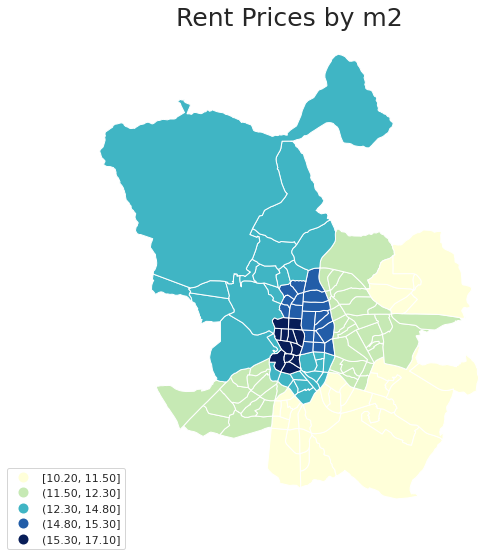

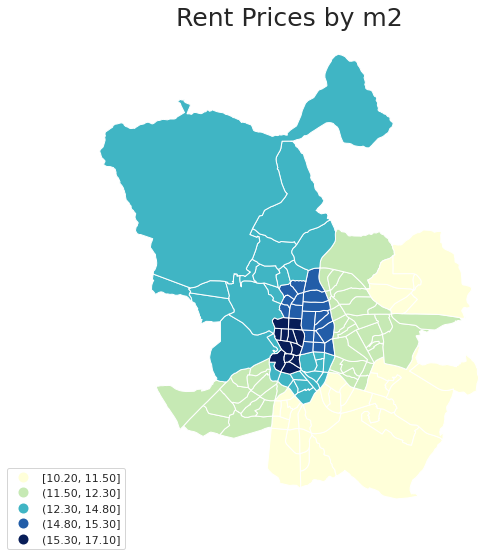

In [25]:
ax = for_plot.plot(column='price',cmap =    
                'YlGnBu', figsize=(15,9),   
                 scheme='quantiles', legend = True)
#add title to the map
ax.set_title('Rent Prices by m2', fontdict= 
            {'fontsize':25})#remove axes
ax.set_axis_off()#move legend to an empty space
ax.get_legend().set_bbox_to_anchor((.12,.12))
ax.get_figure()

In [30]:
#Load Madrid Subway Metro station information (shp file)
metroshp = open("/home/cris/Data/MAD/METRO_MAD/529ac56e-59b5-4a62-bb63-770c3299ded92020329-1-1vqyvme.t5gm.shp", "rb")
metrodbf = open("/home/cris/Data/MAD/METRO_MAD/529ac56e-59b5-4a62-bb63-770c3299ded92020329-1-1vqyvme.t5gm.dbf", "rb")
r = shp.Reader(shp=metroshp, dbf=metrodbf)

sf_metro = shp.Reader("/home/cris/Data/MAD/METRO_MAD/529ac56e-59b5-4a62-bb63-770c3299ded92020329-1-1vqyvme.t5gm.dbf")

sf_metro.shapeType
print('number of metro stations in Madrid:', len(sf_metro))
shapes_matro = sf_metro.shapes()

def read_shapefile(sf):
    #Read a shapefile into a Pandas dataframe with a 'coords' 
    #column holding the geometry information. This uses the pyshp
    #package
    fields = [x[0] for x in sf.fields][1:]
    records = sf.records()
    shps = [s.points for s in sf.shapes()]
    df = pd.DataFrame(columns=fields, data=records)
    df = df.assign(coords=shps)
    return df

metro_shp = read_shapefile(sf_metro)
latitudes = []
longitudes = []

#Once ran the result is stored into shapes.csv and the df 
coordinates_METRO = []
for item, row in metro_shp.iterrows():
    coordinates = row['coords'][0]    
    x1, y1 = coordinates[0], coordinates[1]
    transformer = Transformer.from_crs("epsg:25830", "epsg:4326")
    x2,y2 = transformer.transform(x1, y1)
    coordinates_gps = (x2, y2)
    coordinates_METRO.append(coordinates_gps)
    
metro_shp = metro_shp.assign(coords_gps = coordinates_METRO)

for i, row in metro_shp.iterrows():
    latitudes.append(row['coords_gps'][0])
    longitudes.append(row['coords_gps'][1])
    
#prices = prices.assign(COD_DIS=cod_dis)
metro_shp = metro_shp.assign(latitude=latitudes)
metro_shp = metro_shp.assign(longitude=longitudes)

def dataM2geojson(df):
    features = []
    insert_features = lambda X: features.append(
            geojson.Feature(geometry=geojson.Point((X["longitude"],
                                                    X["latitude"],
                                                    0)),
                            properties=dict(name=X["DENOMINACI"],
                                            description=X["IDACCESO"])))
    df.apply(insert_features, axis=1)
    with open('/home/cris/Data/MAD/map_metro.geojson', 'w', encoding='utf8') as fp:
        geojson.dump(geojson.FeatureCollection(features), fp, sort_keys=True, ensure_ascii=False)

dataM2geojson(metro_shp)

number of metro stations in Madrid: 785


In [31]:
metro_shp.head()

,OBJECTID,IDACCESO,FECHAACTUA,MODO,CODIGOESTA,CODIGOACCE,CODIGOAC_1,DENOMINACI,OBSERVACIO,NIVEL,CODIGOVEST,NUMEROVEST,NUMEROACCE,INDICADORP,CODIGOPROV,CODIGOMUNI,CODIGOVIA,TIPOVIA,PARTICULA,NOMBREVIA,TIPONUMERO,NUMEROPORT,CALIFICADO,CODIGOPOST,SITUACIONR,ACCESOMINU,FECHAALTA,FECHAINICI,FECHAFIN,DISTANCIAA,X,Y,IDFESTACIO,IDFVESTIBU,coords,coords_gps,latitude,longitude
0,1,4_11_39,20150709,4,11,39,011113,Fuencarral,,0,22.0,1.0,3.0,,28,079,99999,Calle,,Gran vía,N,28,,28013,Semiesquina Fuencarral,N,20030318,19930701,,,440571.442,4474832.969,4_11,4_11_22,"[[440462.0011999998, 4474625.479800001]]","(40.42012828984801, -3.701812611628674)",40.420128,-3.701813
1,2,4_11_40,20150709,4,11,40,011114,Montera,,0,22.0,1.0,4.0,,28,079,04172,Calle,de la,Montera,N,44,,28013,Semiesquina Caballero de Gracia,N,20030318,19930701,,,440582.982,4474763.852,4_11,4_11_22,"[[440473.5398000004, 4474556.3618]]","(40.41950646789212, -3.70167013920818)",40.419506,-3.701670
2,3,4_12_41,20150709,4,12,41,011211,Carretas,,0,23.0,1.0,1.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,7,,28013,Semiesquina Carretas,N,20030318,19930701,,,440422.484,4474447.644,4_12,4_12_23,"[[440313.0393000003, 4474240.1544]]","(40.4166464264634, -3.7035322359826868)",40.416646,-3.703532
3,4,4_12_42,20150709,4,12,42,011212,Carmen,,0,23.0,1.0,2.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,12,,28013,"Esquina Montera, 1",N,20030318,19930701,,,440443.262,4474501.791,4_12,4_12_23,"[[440333.8178000003, 4474294.301000001]]","(40.41713569455122, -3.7032924156859264)",40.417136,-3.703292
4,5,4_12_43,20150709,4,12,43,011231,Mayor,,0,25.0,3.0,1.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,9,,28013,Esquina Mayor y Arenal,N,20030318,19930701,,,440333.351,4474455.010,4_12,4_12_25,"[[440223.90699999966, 4474247.521400001]]","(40.416706394551824, -3.7045834584598447)",40.416706,-3.704583


In [ ]:
import fiona
c = fiona.open("/home/cris/Data/MAD/METRO_MAD/529ac56e-59b5-4a62-bb63-770c3299ded92020329-1-1vqyvme.t5gm.shp")
crs = c.crs
crs

In [32]:
metro_shp = metro_shp.rename(columns={"coords": "coords_xy", "coords_gps": "coords"})
metro_shp.head()
#coords = metro_shp['coords'][0]
#coords[0][0]

,OBJECTID,IDACCESO,FECHAACTUA,MODO,CODIGOESTA,CODIGOACCE,CODIGOAC_1,DENOMINACI,OBSERVACIO,NIVEL,CODIGOVEST,NUMEROVEST,NUMEROACCE,INDICADORP,CODIGOPROV,CODIGOMUNI,CODIGOVIA,TIPOVIA,PARTICULA,NOMBREVIA,TIPONUMERO,NUMEROPORT,CALIFICADO,CODIGOPOST,SITUACIONR,ACCESOMINU,FECHAALTA,FECHAINICI,FECHAFIN,DISTANCIAA,X,Y,IDFESTACIO,IDFVESTIBU,coords_xy,coords,latitude,longitude
0,1,4_11_39,20150709,4,11,39,011113,Fuencarral,,0,22.0,1.0,3.0,,28,079,99999,Calle,,Gran vía,N,28,,28013,Semiesquina Fuencarral,N,20030318,19930701,,,440571.442,4474832.969,4_11,4_11_22,"[[440462.0011999998, 4474625.479800001]]","(40.42012828984801, -3.701812611628674)",40.420128,-3.701813
1,2,4_11_40,20150709,4,11,40,011114,Montera,,0,22.0,1.0,4.0,,28,079,04172,Calle,de la,Montera,N,44,,28013,Semiesquina Caballero de Gracia,N,20030318,19930701,,,440582.982,4474763.852,4_11,4_11_22,"[[440473.5398000004, 4474556.3618]]","(40.41950646789212, -3.70167013920818)",40.419506,-3.701670
2,3,4_12_41,20150709,4,12,41,011211,Carretas,,0,23.0,1.0,1.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,7,,28013,Semiesquina Carretas,N,20030318,19930701,,,440422.484,4474447.644,4_12,4_12_23,"[[440313.0393000003, 4474240.1544]]","(40.4166464264634, -3.7035322359826868)",40.416646,-3.703532
3,4,4_12_42,20150709,4,12,42,011212,Carmen,,0,23.0,1.0,2.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,12,,28013,"Esquina Montera, 1",N,20030318,19930701,,,440443.262,4474501.791,4_12,4_12_23,"[[440333.8178000003, 4474294.301000001]]","(40.41713569455122, -3.7032924156859264)",40.417136,-3.703292
4,5,4_12_43,20150709,4,12,43,011231,Mayor,,0,25.0,3.0,1.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,9,,28013,Esquina Mayor y Arenal,N,20030318,19930701,,,440333.351,4474455.010,4_12,4_12_25,"[[440223.90699999966, 4474247.521400001]]","(40.416706394551824, -3.7045834584598447)",40.416706,-3.704583


In [245]:
latitudes = []
longitudes = []
for i, row in metro_shp.iterrows():
    latitudes.append(row['coords'][0])
    longitudes.append(row['coords'][1])
    
#prices = prices.assign(COD_DIS=cod_dis)
metro_shp = metro_shp.assign(latitude=latitudes)
metro_shp = metro_shp.assign(longitude=longitudes)
metro_shp.head()

,OBJECTID,IDACCESO,FECHAACTUA,MODO,CODIGOESTA,CODIGOACCE,CODIGOAC_1,DENOMINACI,OBSERVACIO,NIVEL,CODIGOVEST,NUMEROVEST,NUMEROACCE,INDICADORP,CODIGOPROV,CODIGOMUNI,CODIGOVIA,TIPOVIA,PARTICULA,NOMBREVIA,TIPONUMERO,NUMEROPORT,CALIFICADO,CODIGOPOST,SITUACIONR,ACCESOMINU,FECHAALTA,FECHAINICI,FECHAFIN,DISTANCIAA,X,Y,IDFESTACIO,IDFVESTIBU,coords_xy,coords,latitude,longitude
0,1,4_11_39,20150709,4,11,39,011113,Fuencarral,,0,22.0,1.0,3.0,,28,079,99999,Calle,,Gran vía,N,28,,28013,Semiesquina Fuencarral,N,20030318,19930701,,,440571.442,4474832.969,4_11,4_11_22,"[[440462.0011999998, 4474625.479800001]]","(40.42012828984801, -3.701812611628674)",40.420128,-3.701813
1,2,4_11_40,20150709,4,11,40,011114,Montera,,0,22.0,1.0,4.0,,28,079,04172,Calle,de la,Montera,N,44,,28013,Semiesquina Caballero de Gracia,N,20030318,19930701,,,440582.982,4474763.852,4_11,4_11_22,"[[440473.5398000004, 4474556.3618]]","(40.41950646789212, -3.70167013920818)",40.419506,-3.701670
2,3,4_12_41,20150709,4,12,41,011211,Carretas,,0,23.0,1.0,1.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,7,,28013,Semiesquina Carretas,N,20030318,19930701,,,440422.484,4474447.644,4_12,4_12_23,"[[440313.0393000003, 4474240.1544]]","(40.4166464264634, -3.7035322359826868)",40.416646,-3.703532
3,4,4_12_42,20150709,4,12,42,011212,Carmen,,0,23.0,1.0,2.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,12,,28013,"Esquina Montera, 1",N,20030318,19930701,,,440443.262,4474501.791,4_12,4_12_23,"[[440333.8178000003, 4474294.301000001]]","(40.41713569455122, -3.7032924156859264)",40.417136,-3.703292
4,5,4_12_43,20150709,4,12,43,011231,Mayor,,0,25.0,3.0,1.0,,28,079,04980,Plaza,de la,Puerta del Sol,N,9,,28013,Esquina Mayor y Arenal,N,20030318,19930701,,,440333.351,4474455.010,4_12,4_12_25,"[[440223.90699999966, 4474247.521400001]]","(40.416706394551824, -3.7045834584598447)",40.416706,-3.704583


In [34]:
dataM2geojson(metro_shp)

In [35]:
barrios_geojson = geopandas.read_file('/home/cris/Data/MAD/mapMAD.geojson')

geo_json1 = folium.GeoJson(barrios_geojson)

metro_geojson = geopandas.read_file('/home/cris/Data/MAD/map_metro.geojson')
geo_json_metro = folium.GeoJson(metro_geojson)

# Creating Folium Map
meanLat = BARu['latitude'].mean()
meanLong = BARu['longitude'].mean()
m_neighborhoods_metro = folium.Map(location=[meanLat, meanLong], zoom_start=12)

geo_json1.add_to(m_neighborhoods_metro)

#geo_json_metro.add_to(m_neighborhoods_metro)
layer = folium.FeatureGroup(name='Metro stations')
for feature in geo_json_metro.data['features']:
    if feature['geometry']['type'] == 'Point':
        folium.Marker(location=(float(feature['geometry']['coordinates'][1]),float(feature['geometry']['coordinates'][0])),
                      popup = feature['properties']['name'],
                      icon=folium.Icon(
                          icon='subway',
                          prefix='fa'),
                      ).add_to(layer)

layer.add_to(m_neighborhoods_metro)

#add markers with neighborhoods names
for i, rec in df.iterrows():
    centroid_txt = rec['CENTROID']
    loc = tuple((float(rec['latitude']), float(rec['longitude'])))
    folium.Marker(location=(rec['latitude'], rec['longitude']),
                  popup = rec['NOMBRE'],
                 icon=folium.Icon(color='gray',icon='info-circle',prefix='fa')).add_to(m_neighborhoods_metro)
    
m_neighborhoods_metro

In [36]:
#Load Barcelona Neighborhoods map based on geojson downloaded from BCN Open Data Website:
bcn_barris = gpd.read_file('/home/cris/Data/BCN/BCN_UNITATS_ADM/0301100100_UNITATS_ADM_POLIGONS.json')

gdf = geopandas.GeoDataFrame(bcn_barris)

gdf.set_crs(epsg=25831, inplace=True)
gdf = gdf.to_crs(epsg=4326)
gdf

,FID,ID_ANNEX,ANNEXDESCR,ID_TEMA,TEMA_DESCR,ID_CONJUNT,CONJ_DESCR,ID_SUBCONJ,SCONJ_DESC,ID_ELEMENT,ELEM_DESCR,NIVELL,NDESCR_CA,NDESCR_ES,NDESCR_EN,TERME,DISTRICTE,BARRI,AEB,SEC_CENS,GRANBARRI,ZUA,AREA_I,LITERAL,PERIMETRE,AREA,CODI_UA,TIPUS_UA,NOM,WEB1,WEB2,WEB3,FHEX_COLOR,Shape_Leng,Shape_Area,geometry
0,0,01,Grup - I,0104,Unitats Administratives,010411,Terme Municipal,01041101,Terme Municipal,0104110101,Límit de terme municipal,ADM_01_PL,Límit de terme municipal (polígon),Límite de término municipal (polígono),Municipality boundary (polygon),080193,-,-,-,-,-,-,-,080193,114036.625,1.017050e+08,080193,TERME,Barcelona,http://www.bcn.cat,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#000000,114036.624503,1.017050e+08,"MULTIPOLYGON (((2.18706 41.46772, 2.18580 41.4..."
1,1,01,Grup - I,0104,Unitats Administratives,010412,Districtes,01041201,Districte,0104120101,Límit de districte,ADM_02_PL,Límit de districte (polígon),Límite de distrito (polígono),District boundary (polygon),080193,01,-,-,-,-,-,-,01,21366.962,4.204931e+06,01,DISTRICTE,Ciutat Vella,http://www.bcn.cat/ciutatvella,http://www.bcn.cat/estadistica/catala/dades/gu...,http://www.bcn.cat/estadistica/catala/document...,#000000,21366.961806,4.204931e+06,"POLYGON ((2.18345 41.39061, 2.18238 41.39142, ..."
2,2,01,Grup - I,0104,Unitats Administratives,010412,Districtes,01041201,Districte,0104120101,Límit de districte,ADM_02_PL,Límit de districte (polígon),Límite de distrito (polígono),District boundary (polygon),080193,02,-,-,-,-,-,-,02,13931.644,7.464303e+06,02,DISTRICTE,Eixample,http://www.bcn.cat/eixample,http://www.bcn.cat/estadistica/catala/dades/gu...,http://www.bcn.cat/estadistica/catala/document...,#000000,13931.644175,7.464303e+06,"POLYGON ((2.18690 41.40165, 2.18690 41.40166, ..."
3,3,01,Grup - I,0104,Unitats Administratives,010412,Districtes,01041201,Districte,0104120101,Límit de districte,ADM_02_PL,Límit de districte (polígon),Límite de distrito (polígono),District boundary (polygon),080193,03,-,-,-,-,-,-,03,46711.857,2.287985e+07,03,DISTRICTE,Sants-Montjuïc,http://www.bcn.cat/sants-montjuic,http://www.bcn.cat/estadistica/catala/dades/gu...,http://www.bcn.cat/estadistica/catala/document...,#000000,46711.856798,2.287985e+07,"MULTIPOLYGON (((2.14824 41.37623, 2.14725 41.3..."
4,4,01,Grup - I,0104,Unitats Administratives,010412,Districtes,01041201,Districte,0104120101,Límit de districte,ADM_02_PL,Límit de districte (polígon),Límite de distrito (polígono),District boundary (polygon),080193,04,-,-,-,-,-,-,04,12551.602,6.010769e+06,04,DISTRICTE,Les Corts,http://www.bcn.cat/lescorts,http://www.bcn.cat/estadistica/catala/dades/gu...,http://www.bcn.cat/estadistica/catala/document...,#000000,12551.602001,6.010769e+06,"POLYGON ((2.10342 41.40110, 2.10333 41.40111, ..."
5,5,01,Grup - I,0104,Unitats Administratives,010412,Districtes,01041201,Districte,0104120101,Límit de districte,ADM_02_PL,Límit de districte (polígon),Límite de distrito (polígono),District boundary (polygon),080193,05,-,-,-,-,-,-,05,35757.403,1.991557e+07,05,DISTRICTE,Sarrià-Sant Gervasi,http://www.bcn.cat/sarria-santgervasi,http://www.bcn.cat/estadistica/catala/dades/gu...,http://www.bcn.cat/estadistica/catala/document...,#000000,35757.402601,1.991557e+07,"MULTIPOLYGON (((2.07313 41.43522, 2.07300 41.4..."
6,6,01,Grup - I,0104,Unitats Administratives,010412,Districtes,01041201,Districte,0104120101,Límit de districte,ADM_02_PL,Límit de districte (polígon),Límite de distrito (polígono),District boundary (polygon),080193,06,-,-,-,-,-,-,06,12482.174,4.224278e+06,06,DISTRICTE,Gràcia,http://www.bcn.cat/gracia,http://www.bcn.cat/estadistica/catala/dades/gu...,http://www.bcn.cat/estadistica/catala/document...,#000000,12482.174349,4.224278e+06,"POLYGON ((2.13629 41.42363, 2.13621 41.42368, ..."
7,7,01,Grup - I,0104,Unitats Administratives,010412,Districtes,01041201,Districte,0104120101,Límit de districte,ADM_02_PL,Límit de districte (polígon),Límite de distrito (polí

In [37]:
#Filter only Barris (neighborhoods)
gdf['TIPUS_UA'].unique()
filterBarri = gdf['CONJ_DESCR'].str.contains('Barris')
gdf = gdf.where(filterBarri)
gdf = gdf.dropna(subset=['TIPUS_UA'])
gdf

,FID,ID_ANNEX,ANNEXDESCR,ID_TEMA,TEMA_DESCR,ID_CONJUNT,CONJ_DESCR,ID_SUBCONJ,SCONJ_DESC,ID_ELEMENT,ELEM_DESCR,NIVELL,NDESCR_CA,NDESCR_ES,NDESCR_EN,TERME,DISTRICTE,BARRI,AEB,SEC_CENS,GRANBARRI,ZUA,AREA_I,LITERAL,PERIMETRE,AREA,CODI_UA,TIPUS_UA,NOM,WEB1,WEB2,WEB3,FHEX_COLOR,Shape_Leng,Shape_Area,geometry
11,11.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,01,01,-,-,01,-,-,01,5521.647,1.100286e+06,01,BARRI,el Raval,http://lameva.barcelona.cat/ciutatvella/ca/hom...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#E66900,5521.646549,1.100286e+06,"POLYGON ((2.16471 41.38593, 2.16401 41.38540, ..."
12,12.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,01,02,-,-,02,-,-,02,5198.000,8.155939e+05,02,BARRI,el Barri Gòtic,http://lameva.barcelona.cat/ciutatvella/ca/hom...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#E66900,5197.999887,8.155939e+05,"POLYGON ((2.17701 41.38525, 2.17658 41.38558, ..."
13,13.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,01,03,-,-,03,-,-,03,13853.129,1.179382e+06,03,BARRI,la Barceloneta,http://lameva.barcelona.cat/ciutatvella/ca/hom...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#E66900,13853.129525,1.179382e+06,"POLYGON ((2.19623 41.38745, 2.19617 41.38746, ..."
14,14.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,01,04,-,-,04,-,-,04,4664.483,1.109669e+06,04,BARRI,"Sant Pere, Santa Caterina i la Ribera",http://lameva.barcelona.cat/ciutatvella/ca/hom...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#E66900,4664.482949,1.109669e+06,"POLYGON ((2.18345 41.39061, 2.18238 41.39142, ..."
15,15.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,02,05,-,-,05,-,-,05,4137.329,9.293558e+05,05,BARRI,el Fort Pienc,http://lameva.barcelona.cat/eixample/ca/home/e...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#E66900,4137.328784,9.293558e+05,"POLYGON ((2.18353 41.39227, 2.18388 41.39253, ..."
16,16.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,02,06,-,-,06,-,-,06,4358.094,1.041829e+06,06,BARRI,la Sagrada Família,http://lameva.barcelona.cat/eixample/ca/home/e...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#E66900,4358.093566,1.041829e+06,"POLYGON ((2.17337 41.39999, 2.17503 41.40042, ..."
17,17.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_03_PL,Límit de barri (polígon),Límite de barrrio (polígono),Neighborhood boundary (polygon),080193,02,07,-,-,07,-,-,07,6444.110,2.119874e+06,07,BARRI,la Dreta de l'Eixample,http://lameva.barcelona.cat/eixample/ca/home/e...,http://www.bcn.cat/estadistica/catala/dades/in...,http://www.bcn.cat/estadistica/catala/document...,#E66900,6444.110358,2.119874e+06,"POLYGON ((2.17091 41.40182, 2.17072 41.40196, ..."
18,18.0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,ADM_

In [38]:
geo_json_bcn_barris = folium.GeoJson(gdf)

# Creating Folium Map
meanLat_bcn = 41.40403418435624
meanLong_bcn = 2.18449580662915
b_neighborhoods = folium.Map(location=[meanLat_bcn, meanLong_bcn], zoom_start=12)

geo_json_bcn_barris.add_to(b_neighborhoods)

centroids = []
latitudes = []
longitudes = []
texts_nom = []
#Defining Centroids for each neighborhood:
for j, row in gdf.iterrows():
    txt_1 = ''
    if gdf['geometry'][j].geom_type == 'Polygon':
        Poly = Polygon(gdf['geometry'][j])
    else:
        if gdf['geometry'][j].geom_type == 'MultiPolygon':
            Poly = Polygon(gdf['geometry'][j][0])
    centroid = Poly.centroid.wkt 
    centroid = centroid.strip('POINT ')
    coord_cent = tuple(float(s) for s in centroid.strip('()').split())
    centroids.append(str(coord_cent))
    latitudes.append(coord_cent[1])
    longitudes.append(coord_cent[0])
    txt_1 = str(row['NOM'])
    txt_1 = txt_1.replace('\n','')
    txt_1 = txt_1.replace('\r','')
    txt_1 = txt_1.replace(',','_')
    txt_1 = txt_1.replace("'", "")
    txt_1 = txt_1.replace('"', "")
    if len(txt_1) < 5:
        txt_1 = 'Non defined'
    texts_nom.append(txt_1)
    
gdf = gdf.assign(CENTROID=centroids)
gdf = gdf.assign(latitude=latitudes)
gdf = gdf.assign(longitude=longitudes)
gdf = gdf.assign(NOMBRE=texts_nom)

#add markers with neighborhoods names
for i, rec in gdf.iterrows():
    #geo_json_bcn_barris.add_child(folium.Popup(str(rec['NOMBRE'])))
    folium.Marker(location=(float(rec['latitude']), float(rec['longitude'])),
                  popup = rec['NOMBRE'],
                  icon=folium.Icon(color='gray',icon='info-circle',prefix='fa')).add_to(b_neighborhoods)

b_neighborhoods.save("/home/cris/Data/BCN/BCN_map.html")

b_neighborhoods

In [39]:
gdf.shape[0]

73

In [40]:
gdf['NOMBRE'].unique()

array(['el Raval', 'el Barri Gòtic', 'la Barceloneta',
       'Sant Pere_ Santa Caterina i la Ribera', 'el Fort Pienc',
       'la Sagrada Família', 'la Dreta de lEixample',
       'lAntiga Esquerra de lEixample', 'la Nova Esquerra de lEixample',
       'Sant Antoni', 'el Poble-sec', 'la Marina del Prat Vermell',
       'la Marina de Port', 'la Font de la Guatlla', 'Hostafrancs',
       'la Bordeta', 'Sants - Badal', 'Sants', 'les Corts',
       'la Maternitat i Sant Ramon', 'Pedralbes',
       'Vallvidrera_ el Tibidabo i les Planes', 'Sarrià',
       'les Tres Torres', 'Sant Gervasi - la Bonanova',
       'Sant Gervasi - Galvany', 'el Putxet i el Farró',
       'Vallcarca i els Penitents', 'el Coll', 'la Salut',
       'la Vila de Gràcia', 'el Camp den Grassot i Gràcia Nova',
       'el Baix Guinardó', 'Can Baró', 'el Guinardó',
       'la Font den Fargues', 'el Carmel', 'la Teixonera',
       'Sant Genís dels Agudells', 'Montbau', 'la Vall dHebron',
       'la Clota', 'Horta', 'Vilap

In [41]:
gdf_bcn = gdf[['NOMBRE', 'latitude', 'longitude']]

In [42]:
gdf_bcn.head()

,NOMBRE,latitude,longitude
11,el Raval,41.378999,2.170437
12,el Barri Gòtic,41.381292,2.177312
13,la Barceloneta,41.377684,2.190148
14,Sant Pere_ Santa Caterina i la Ribera,41.386795,2.183431
15,el Fort Pienc,41.397406,2.181499


In [43]:
#load Barcelona Subway Metro stations based on geojson downloaded from TMB Developers portal:
bcn_metro = gpd.read_file('/home/cris/Data/BCN/estacions.json')

gdf_metro = geopandas.GeoDataFrame(bcn_metro)

gdf_metro.head()


for i, rec in gdf_metro.iterrows():
    txt_2 = str(rec['NOM_ESTACIO'])
    txt_2 = txt_2.replace('\n','')
    txt_2 = txt_2.replace('\r','')
    txt_2 = txt_2.replace(',','_')
    txt_2 = txt_2.replace("'", "")
    txt_2 = txt_2.replace('"', "")
    
    metro_text = str(rec['geometry'])
    metro_point = metro_text.strip('POINT ')
    metro_point = tuple(float(s) for s in metro_point.strip('()').split())
    #add markers to previous map for the metro stations:
    folium.Marker(location=(float(metro_point[1]), float(metro_point[0])),
                  popup = txt_2,
                  icon=folium.Icon(color='blue',icon='subway',prefix='fa')).add_to(b_neighborhoods)

    
b_neighborhoods

In [44]:
gdf_metro.head()

,id,CODI_GRUP_ESTACIO,NOM_ESTACIO,PICTO,DATA,geometry
0,ESTACIONS.6660111,6660111,Hospital de Bellvitge,L1,2020-12-04,POINT (2.10724 41.34468)
1,ESTACIONS.6660112,6660112,Bellvitge,L1,2020-12-04,POINT (2.11092 41.35097)
2,ESTACIONS.6660113,6660113,Av. Carrilet,L1,2020-12-04,POINT (2.10264 41.35852)
3,ESTACIONS.6660114,6660114,Rambla Just Oliveras,L1,2020-12-04,POINT (2.09975 41.36409)
4,ESTACIONS.6660115,6660115,Can Serra,L1,2020-12-04,POINT (2.10276 41.36769)


## 3. Methodology section:

This section represents the main component of the report where the data is gathered, prepared for analysis. The tools described are used here and the Notebook cells indicates the execution of steps. 

### The analysis and the stragegy:
The strategy is based on mapping the above described data in section 2.0, in order to facilitate the choice of at least two neighborhoods in Madrid to rent an apartment. The choice is made based on the demands imposed : location near a subway, rental price and similar venues to Barcelona current home location. This visual approach and maps with popups labels allow quick identification of  location and price, thus  making the selection very easy. 

The procesing of these DATA and its mapping will allow to answer the key questions to make a decision:
- what is the cost of available rental places that meet the demands?
- what is the cost of rent around a mile radius from each subway metro station?
- What is the distance from work place ( Av. del Partenón, 4 [40.46310642131838, -3.61827938870383]) and the tentative future rental home?
- What are the venues of the two best places to live? How the prices compare?
- How venues distribute among Madrid neighborhoods and around metro stations?

#      METHODOLOY EXECUTION  - Mapping Data

## Barcelona Map - Current residence and venues in neighborhood
for comparison to future Madrid renting place

In [62]:
# Castillejos, 325, District 02 - Eixample, Neighborhood: 06, Sagrada Familia (Barcelona)
#41.40875910764951, 2.1751304828215483
address = 'Castillejos, 325, 08025, Barcelona, Barcelona'
geolocator = Nominatim(user_agent="bcn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Barcelona home are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Barcelona home are 41.408730285714284, 2.1752108142857143.


In [63]:
neighborhood_latitude=41.408730285714284
neighborhood_longitude=2.1752108142857143

## Dial FourSquare to find venues around current residence in Barcelona

In [526]:
#@hidden_cell
CLIENT_ID = 'DVCTZxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxFLF1T' # my Foursquare ID
CLIENT_SECRET = '5NWAGXRxxxxxxxxxxxxxxxxxxxxxxxxxxxxx5LFWL1' # my Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [524]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius
# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)

In [360]:
# results display is hidden for report simplification 
results = requests.get(url).json()
#results 

#### function that extracts the category of the venue - borrow from the Foursquare lab.

In [68]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [69]:
venues = results['response']['groups'][0]['items']
SGnearby_venues = pd.json_normalize(venues) # flatten JSON
# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
SGnearby_venues =SGnearby_venues.loc[:, filtered_columns]
# filter the category for each row
SGnearby_venues['venue.categories'] = SGnearby_venues.apply(get_category_type, axis=1)
# clean columns
SGnearby_venues.columns = [col.split(".")[-1] for col in SGnearby_venues.columns]

SGnearby_venues.shape

(100, 4)

In [213]:
# Venues list near current Barcelona residence place
SGnearby_venues.head(10)

,name,categories,lat,lng
0,La Selva,Steakhouse,41.408650,2.173317
1,La Cerveseria Clandestina,Bar,41.408735,2.175168
2,Jugar × Jugar,Toy / Game Store,41.407116,2.174372
3,Arroseria Gaudí,Spanish Restaurant,41.408278,2.174391
4,Beerivins,Brewery,41.407640,2.173924
5,Puiggròs,Bakery,41.410207,2.174280
6,Phenomena,Indie Movie Theater,41.409134,2.171725
7,Celler Miquel,Brewery,41.409895,2.173680
8,Sant Pau Recinte Modernista (Recinto Modernist...,Historic Site,41.411352,2.174380
9,BRO Room,Sandwich Place,41.407018,2.173568


In [179]:
print('There are {} uniques categories.'.format(len(SGnearby_venues['categories'].unique())))

There are 56 uniques categories.


In [180]:
# one hot encoding
bcn_onehot = pd.get_dummies(SGnearby_venues[['categories']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
bcn_onehot['Neighborhood'] = 'Sagrada Familia' 

# move neighborhood column to the first column
fixed_columns = [bcn_onehot.columns[-1]] + list(bcn_onehot.columns[:-1])
bcn_onehot = bcn_onehot[fixed_columns]

bcn_onehot.head()

,Neighborhood,Arepa Restaurant,Asian Restaurant,Bakery,Bar,Beer Bar,Beer Store,Big Box Store,Bookstore,Breakfast Spot,Brewery,Burger Joint,Café,Chinese Restaurant,Chocolate Shop,Coffee Shop,College Gym,Comfort Food Restaurant,Deli / Bodega,Diner,Escape Room,Fast Food Restaurant,French Restaurant,Gastropub,General Travel,Grocery Store,Historic Site,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Market,Middle Eastern Restaurant,Pastry Shop,Pizza Place,Plaza,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Spanish Restaurant,Steakhouse,Supermarket,Tapas Restaurant,Theme Park Ride / Attraction,Toy / Game Store,Turkish Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Wine Bar,Wine Shop
0,Sagrada Familia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,Sagrada Familia,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Sagrada Familia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,Sagrada Familia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,Sagrada Familia,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Finally we get the list of venues with percentages in my current home neighborhood in Barcelona

In [181]:
bcn_grouped = bcn_onehot.groupby('Neighborhood').mean().reset_index()
bcn_grouped

,Neighborhood,Arepa Restaurant,Asian Restaurant,Bakery,Bar,Beer Bar,Beer Store,Big Box Store,Bookstore,Breakfast Spot,Brewery,Burger Joint,Café,Chinese Restaurant,Chocolate Shop,Coffee Shop,College Gym,Comfort Food Restaurant,Deli / Bodega,Diner,Escape Room,Fast Food Restaurant,French Restaurant,Gastropub,General Travel,Grocery Store,Historic Site,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Market,Middle Eastern Restaurant,Pastry Shop,Pizza Place,Plaza,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Spanish Restaurant,Steakhouse,Supermarket,Tapas Restaurant,Theme Park Ride / Attraction,Toy / Game Store,Turkish Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Wine Bar,Wine Shop
0,Sagrada Familia,0.02,0.01,0.05,0.03,0.01,0.01,0.01,0.01,0.03,0.02,0.02,0.01,0.01,0.01,0.04,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.05,0.01,0.01,0.04,0.01,0.02,0.01,0.06,0.03,0.01,0.02,0.01,0.01,0.01,0.03,0.01,0.05,0.01,0.01,0.02,0.02,0.04,0.01,0.02,0.02,0.01,0.01,0.01,0.01,0.01,0.02,0.01


In [183]:
#Function to sort venues in descending order:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [185]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venuesneighborhoods
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
bcn_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
bcn_neighborhoods_venues_sorted['Neighborhood'] = bcn_grouped['Neighborhood']

for ind in np.arange(bcn_grouped.shape[0]):
    bcn_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(bcn_grouped.iloc[ind, :], num_top_venues)

bcn_neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Sagrada Familia,Italian Restaurant,Bakery,Grocery Store,Restaurant,Hotel,Coffee Shop,Spanish Restaurant,Pizza Place,Bar,Breakfast Spot


## Map of Barcelona residence place with venues in Neighborhood - for reference

In [72]:
latitude=41.408730285714284
longitude=2.1752108142857143
# create map of Barcelona place  using latitude and longitude values
map_sg = folium.Map(location=[latitude, longitude], zoom_start=18)
# add markers to map
for lat, lng, label in zip(SGnearby_venues['lat'], SGnearby_venues['lng'], SGnearby_venues['name']):
    label = folium.Popup(label, parse_html=True)
    folium.RegularPolygonMarker(
        [lat, lng],
        number_of_sides=30,
        radius=7,
        popup=label,
        color='blue',
        fill_color='#0f0f0f',
        fill_opacity=0.6,
    ).add_to(map_sg)  
    
map_sg

# MADRID NEIGHBORHOODS - DATA AND MAPPING 

In [76]:
# Read dataframe created in Data section:
print('Number of Madrid neighborhoods: ', str(df_neigh.shape[0]))
df_neigh.head()

Number of Madrid neighborhoods:  131


,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE
0,17,172,"(40.34088799078875, -3.688371579197298)",40.3409,-3.68837,San Cristóbal
1,17,173,"(40.33711488700938, -3.676254238025643)",40.3371,-3.67625,Butarque
2,17,175,"(40.35579042948162, -3.699136963903404)",40.3558,-3.69914,Los Ángeles
3,17,174,"(40.35569711292909, -3.688489329452058)",40.3557,-3.68849,Los Rosales
4,17,171,"(40.34144808026994, -3.708948525264152)",40.3414,-3.70895,"Villaverde Alto, Casco Histórico de Villaverde"


In [92]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [97]:
nearby_venues = pd.DataFrame()
names=df_neigh['NOMBRE']
latitudes=df_neigh['latitude']
longitudes=df_neigh['longitude']
venues_list=[]
i = 0
for name, lat, lng in zip(names, latitudes, longitudes):
    i = i + 1
    print(name)

    # create the API request URL
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        lat, 
        lng, 
        radius, 
        LIMIT)

    # make the GET request
    results = requests.get(url).json()["response"]['groups'][0]['items']

    # return only relevant information for each nearby venue
    venues_list.append([(
        name, 
        lat, 
        lng, 
        v['venue']['name'], 
        v['venue']['location']['lat'], 
        v['venue']['location']['lng'],  
        v['venue']['categories'][0]['name']) for v in results])

nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
nearby_venues.columns = ['Neighborhood', 
              'Neighborhood Latitude', 
              'Neighborhood Longitude', 
              'Venue', 
              'Venue Latitude', 
              'Venue Longitude', 
              'Venue Category']

San Cristóbal
Butarque
Los Ángeles
Los Rosales
Villaverde Alto, Casco Histórico de Villaverde
Orcasitas
Ensanche de Vallecas
Buenavista
Cuatro Vientos
San Fermín
Casco Histórico de Vallecas
Orcasur
Zofío
Pradolongo
Abrantes
Puerta Bonita
Almendrales
Santa Eugenia
Vista Alegre
Entrevías
Águilas
Palomeras Sureste
Palomeras Bajas
Legazpi
Moscardó
Opañel
San Diego
Portazgo
Comillas
Campamento
Chopera
Delicias
Aluche
Pavones
Valderrivas
San Isidro
Valdebernardo
Numancia
Adelfas
Acacias
Pacífico
Palos de Moguer
Fontarrón
Atocha
Cármenes
Vinateros
Lucero
Horcajo
Imperial
Embajadores
Marroquina
Niño Jesús
Puerta del Ángel
Media Legua
Cortes
Sol
Estrella
Jerónimos
Ibiza
Palacio
Arcos
Goya
Amposta
Justicia
Recoletos
Universidad
Fuente del Berro
Ventas
Hellín
Argüelles
Lista
Pueblo Nuevo
Castellana
Almagro
Trafalgar
Arapiles
Gaztambide
Quintana
Simancas
Guindalera
Concepción
Rios Rosas
Vallehermoso
San Pascual
Canillejas
Rosas
Salvador
Rejas
Casa de Campo
El Viso
Ciudad Jardín
Prosperidad
San Jua

In [100]:
nearby_venues.head(20)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,San Cristóbal,40.340888,-3.688372,Cercanías San Cristóbal de Los Ángeles,40.341710,-3.683878,Train Station
1,San Cristóbal,40.340888,-3.688372,Bar Vietnam,40.341090,-3.686568,Snack Place
2,San Cristóbal,40.340888,-3.688372,El Rincón de Peri,40.342427,-3.691998,Breakfast Spot
3,San Cristóbal,40.340888,-3.688372,Metro San Cristóbal,40.341390,-3.692797,Metro Station
4,Butarque,40.337115,-3.676254,Mercadona,40.340165,-3.675179,Grocery Store
5,Butarque,40.337115,-3.676254,Plaza de los Metales,40.341278,-3.675721,Plaza
6,Los Ángeles,40.355790,-3.699137,Restaurante El Gallardo,40.354987,-3.699341,Bar
7,Los Ángeles,40.355790,-3.699137,Parque Ciudad de los Ángeles,40.354648,-3.697011,Park
8,Los Ángeles,40.355790,-3.699137,Cerveceria Candy,40.357753,-3.694217,Tapas Restaurant
9,Los Ángeles,40.355790,-3.699137,Galería Luyego,40.351728,-3.697082,Grocery Store


In [101]:
#save result into csv:
nearby_venues.to_csv('/home/cris/Data/MAD/nearby_venues_byNeighborhood.csv')

Let's check how many venues were returned for each neighborhood

In [491]:
#Create a dictionary with number of Venues per neighborhood in madrid (limit = 100 venues)
temp1 = nearby_venues.groupby('Neighborhood').count()
dict_tot = dict(temp1['Venue'])
dict_tot

{'Abrantes': 6,
 'Acacias': 50,
 'Adelfas': 36,
 'Aeropuerto': 2,
 'Alameda de Osuna': 21,
 'Almagro': 100,
 'Almenara': 8,
 'Almendrales': 18,
 'Aluche': 14,
 'Amposta': 8,
 'Apostol Santiago': 6,
 'Arapiles': 71,
 'Aravaca': 1,
 'Arcos': 13,
 'Argüelles': 38,
 'Atalaya': 8,
 'Atocha': 30,
 'Bellas Vistas': 28,
 'Berruguete': 34,
 'Buenavista': 5,
 'Butarque': 2,
 'Campamento': 1,
 'Canillas': 15,
 'Canillejas': 14,
 'Casa de Campo': 1,
 'Casco Histórico de Barajas': 36,
 'Castellana': 100,
 'Castilla': 27,
 'Castillejos': 89,
 'Chopera': 46,
 'Ciudad Jardín': 51,
 'Ciudad Universitaria': 1,
 'Colina': 18,
 'Comillas': 30,
 'Concepción': 17,
 'Corralejos': 6,
 'Cortes': 100,
 'Costillares': 14,
 'Cuatro Caminos': 60,
 'Cuatro Vientos': 4,
 'Cármenes': 6,
 'Delicias': 27,
 'El Goloso': 3,
 'El Plantío': 9,
 'El Viso': 24,
 'Embajadores': 57,
 'Ensanche de Vallecas': 41,
 'Entrevías': 6,
 'Estrella': 23,
 'Fontarrón': 5,
 'Fuente del Berro': 35,
 'Fuentelareina': 2,
 'Gaztambide': 99,
 

In [490]:
num_bcn_venues = SGnearby_venues.shape[0]
print('Num of venues near home location (radius 500m) at Barcelona: ', str(num_bcn_venues))

Num of venues near home location (radius 500m) at Barcelona:  100


#### Let's find out how many unique categories can be curated from all the returned venues

In [108]:
print('There are {} uniques categories.'.format(len(nearby_venues['Venue Category'].unique())))

There are 279 uniques categories.


In [109]:
# one hot encoding
madrid_onehot = pd.get_dummies(nearby_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
madrid_onehot['Neighborhood'] = nearby_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [madrid_onehot.columns[-1]] + list(madrid_onehot.columns[:-1])
madrid_onehot = madrid_onehot[fixed_columns]

madrid_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Airport,Airport Service,American Restaurant,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Board Shop,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Burger Joint,Burrito Place,Bus Station,Cafeteria,Café,Campground,Candy Store,Casino,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Dive Shop,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Embassy / Consulate,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Library,Light Rail Station,Liquor Store,Locksmith,Lounge,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Other Great Outdoors,Other Nightlife,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pizza Place,Planetarium,Platform,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Public Art,Ramen Restaurant,Rental Car Location,Rental Service,Resort,Rest Area,Restaurant,Road,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stables,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tattoo Parlor,Taverna,Tea Room,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Track,Trade School,Train Station,Travel Lounge,Turkish Restaurant,Udon Restaurant,Used Bookstore,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Whisky Bar,Wine Bar,Wine Shop,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [111]:
madrid_onehot.shape

(3370, 279)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [494]:
madrid_grouped = madrid_onehot.groupby('Neighborhood').mean().reset_index()
madrid_grouped['Total_venues'] = madrid_grouped['Neighborhood'].map(dict_tot)
madrid_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Airport,Airport Service,American Restaurant,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Board Shop,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Burger Joint,Burrito Place,Bus Station,Cafeteria,Café,Campground,Candy Store,Casino,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Dive Shop,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Embassy / Consulate,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Library,Light Rail Station,Liquor Store,Locksmith,Lounge,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Other Great Outdoors,Other Nightlife,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pizza Place,Planetarium,Platform,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Public Art,Ramen Restaurant,Rental Car Location,Rental Service,Resort,Rest Area,Restaurant,Road,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stables,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tattoo Parlor,Taverna,Tea Room,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Track,Trade School,Train Station,Travel Lounge,Turkish Restaurant,Udon Restaurant,Used Bookstore,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Total_venues
0,Abrantes,0.00,0.00000,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.00000

#### Let's print each neighborhood along with the top 10 most common venues

In [495]:
num_top_venues = 10

for hood in madrid_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = madrid_grouped[madrid_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abrantes----
                  venue  freq
0          Total_venues  6.00
1          Soccer Field  0.17
2  Fast Food Restaurant  0.17
3    Athletics & Sports  0.17
4         Grocery Store  0.17
5           Pizza Place  0.17
6                  Park  0.17
7                Office  0.00
8           Opera House  0.00
9          Optical Shop  0.00


----Acacias----
                  venue   freq
0          Total_venues  50.00
1    Spanish Restaurant   0.12
2           Supermarket   0.06
3                   Bar   0.06
4           Pizza Place   0.06
5            Playground   0.04
6                  Café   0.04
7                   Gym   0.04
8  Gym / Fitness Center   0.04
9         Indie Theater   0.04


----Adelfas----
                  venue   freq
0          Total_venues  36.00
1           Supermarket   0.08
2        Breakfast Spot   0.06
3         Grocery Store   0.06
4                   Bar   0.06
5                  Café   0.06
6    Spanish Restaurant   0.06
7  Fast Food Restaurant   0.

                   venue  freq
0           Total_venues  3.00
1                Stables  0.67
2             Restaurant  0.33
3      Polish Restaurant  0.00
4            Opera House  0.00
5      Paella Restaurant  0.00
6  Outdoors & Recreation  0.00
7      Outdoor Sculpture  0.00
8        Other Nightlife  0.00
9   Other Great Outdoors  0.00


----El Plantío----
                      venue  freq
0              Total_venues  9.00
1              Burger Joint  0.22
2        Italian Restaurant  0.22
3          Asian Restaurant  0.11
4       American Restaurant  0.11
5       Japanese Restaurant  0.11
6  Mediterranean Restaurant  0.11
7                       Gym  0.11
8         Outdoor Sculpture  0.00
9                      Park  0.00


----El Viso----
                      venue   freq
0              Total_venues  24.00
1        Spanish Restaurant   0.12
2                Restaurant   0.08
3  Mediterranean Restaurant   0.08
4          Theme Restaurant   0.04
5          Tapas Restaurant   0.04
6

                venue  freq
0        Total_venues   5.0
1  Athletics & Sports   0.2
2         Cheese Shop   0.2
3             Stadium   0.2
4        Tennis Court   0.2
5         Sports Club   0.2
6   Korean Restaurant   0.0
7                Park   0.0
8           Nightclub   0.0
9        Noodle House   0.0


----Portazgo----
                           venue  freq
0                   Total_venues  6.00
1                            Bar  0.50
2                      BBQ Joint  0.17
3                    Pizza Place  0.17
4                   Dessert Shop  0.17
5                     Whisky Bar  0.00
6           Other Great Outdoors  0.00
7  Paper / Office Supplies Store  0.00
8                         Palace  0.00
9              Paella Restaurant  0.00


----Pradolongo----
                     venue  freq
0             Total_venues   5.0
1              Beer Garden   0.2
2                     Park   0.2
3                  Theater   0.2
4                    Plaza   0.2
5       Spanish Restauran

#### Let's put that into a _pandas_ dataframe

In [496]:
#Function to sort venues in descending order:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [500]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venuesneighborhoods
columns = ['Neighborhood', 'Total_venues']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = madrid_grouped['Neighborhood']
neighborhoods_venues_sorted['Total_venues'] = madrid_grouped['Total_venues']

for ind in np.arange(madrid_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 2:] = return_most_common_venues(madrid_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,Total_venues,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abrantes,6,Total_venues,Pizza Place,Grocery Store,Park,Athletics & Sports,Fast Food Restaurant,Soccer Field,Food Truck,Food Stand,Food Court
1,Acacias,50,Total_venues,Spanish Restaurant,Supermarket,Bar,Pizza Place,Indie Theater,Park,Tapas Restaurant,Café,Pub
2,Adelfas,36,Total_venues,Supermarket,Bar,Grocery Store,Fast Food Restaurant,Spanish Restaurant,Café,Breakfast Spot,Brewery,Gift Shop
3,Aeropuerto,2,Total_venues,Accessories Store,Airport Service,Food Court,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop
4,Alameda de Osuna,21,Total_venues,Park,Bakery,Smoke Shop,Hobby Shop,Restaurant,Fried Chicken Joint,Spanish Restaurant,Bookstore,Scenic Lookout


## Now we compare this values of venues of all the Madrid neighborhoods, with the values of venues at Home in Barcelona (first of all filtering only the categories that are included in Barcelona)

In [501]:
columns_list = []
to_delete = []
print('Total venue categories in BCN home = ', str(bcn_grouped.shape[1]))
for col in bcn_grouped.columns.to_list():
    find = 0
    for col2 in madrid_grouped.columns.to_list():
        if col == col2:
            columns_list.append(col)
            find = 1
    if find == 0:
        print('columna a eliminar: ', col)
        to_delete.append(col)
print('columnas coincidentes = ', str(len(columns_list)))

madrid_grouped_bcn = madrid_grouped[columns_list]
madrid_grouped_bcn.head()
bcn_grouped2 = bcn_grouped.drop(columns = to_delete)
bcn_grouped2 = bcn_grouped2.drop(columns = ['Neighborhood'])
madrid_grouped_bcn2 = madrid_grouped_bcn.drop(columns = ['Neighborhood'])

Total venue categories in BCN home =  57
columna a eliminar:  College Gym
columna a eliminar:  General Travel
columna a eliminar:  Theme Park Ride / Attraction
columnas coincidentes =  54


In [502]:
madrid_grouped_bcn2.shape

(126, 53)

In [503]:
import scipy
ary = scipy.spatial.distance.cdist(madrid_grouped_bcn2, bcn_grouped2, metric='euclidean')
madrid_grouped_bcn[ary==ary.min()]

,Neighborhood,Arepa Restaurant,Asian Restaurant,Bakery,Bar,Beer Bar,Beer Store,Big Box Store,Bookstore,Breakfast Spot,Brewery,Burger Joint,Café,Chinese Restaurant,Chocolate Shop,Coffee Shop,Comfort Food Restaurant,Deli / Bodega,Diner,Escape Room,Fast Food Restaurant,French Restaurant,Gastropub,Grocery Store,Historic Site,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Market,Middle Eastern Restaurant,Pastry Shop,Pizza Place,Plaza,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Spanish Restaurant,Steakhouse,Supermarket,Tapas Restaurant,Toy / Game Store,Turkish Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Wine Bar,Wine Shop
61,Justicia,0.0,0.01,0.05,0.02,0.0,0.01,0.0,0.03,0.0,0.01,0.0,0.02,0.0,0.0,0.01,0.0,0.03,0.0,0.01,0.0,0.0,0.01,0.0,0.0,0.0,0.05,0.0,0.01,0.0,0.04,0.01,0.0,0.0,0.01,0.0,0.0,0.01,0.02,0.07,0.01,0.0,0.02,0.0,0.05,0.0,0.0,0.03,0.0,0.0,0.04,0.0,0.01,0.01


### Based on this analysis, the most similar neighborhood in Madrid to Sagrada Familia in Barcelona (based on venues availability) is <u>Justicia</u>.

In [528]:
neigh_corr = pd.DataFrame(ary)
neigh_corr = neigh_corr.assign(key1=neigh_corr.index)
madrid_grouped_bcn = madrid_grouped_bcn.assign(key2=madrid_grouped_bcn.index)
madrid_neigh_corr = madrid_grouped_bcn.join(neigh_corr.set_index('key1'), on='key2')
madrid_neigh_corr.columns
madrid_neigh_corr['Total_venues'] = madrid_neigh_corr['Neighborhood'].map(dict_tot)
madrid_neigh_corr.sort_values(by=[0])

,Neighborhood,Arepa Restaurant,Asian Restaurant,Bakery,Bar,Beer Bar,Beer Store,Big Box Store,Bookstore,Breakfast Spot,Brewery,Burger Joint,Café,Chinese Restaurant,Chocolate Shop,Coffee Shop,Comfort Food Restaurant,Deli / Bodega,Diner,Escape Room,Fast Food Restaurant,French Restaurant,Gastropub,Grocery Store,Historic Site,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Market,Middle Eastern Restaurant,Pastry Shop,Pizza Place,Plaza,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Spanish Restaurant,Steakhouse,Supermarket,Tapas Restaurant,Toy / Game Store,Turkish Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Wine Bar,Wine Shop,key2,0,Total_venues
61,Justicia,0.000000,0.010000,0.050000,0.020000,0.000000,0.010000,0.000000,0.030000,0.000000,0.010000,0.000000,0.020000,0.000000,0.000000,0.010000,0.000000,0.030000,0.000000,0.01,0.000000,0.000000,0.010000,0.000000,0.00,0.000000,0.050000,0.000000,0.010000,0.000000,0.040000,0.010000,0.000000,0.000000,0.010000,0.000000,0.000000,0.010000,0.020000,0.070000,0.010000,0.000000,0.020000,0.000000,0.050000,0.000000,0.000000,0.030000,0.000000,0.000000,0.040000,0.00,0.010000,0.010000,61,0.111803,100
29,Chopera,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.021739,0.000000,0.000000,0.000000,0.043478,0.021739,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.021739,0.043478,0.00,0.000000,0.000000,0.000000,0.021739,0.021739,0.043478,0.000000,0.021739,0.000000,0.021739,0.000000,0.000000,0.000000,0.021739,0.021739,0.000000,0.000000,0.000000,0.021739,0.043478,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,29,0.122854,46
83,Palos de Moguer,0.021277,0.010638,0.042553,0.000000,0.010638,0.000000,0.000000,0.010638,0.031915,0.021277,0.010638,0.042553,0.010638,0.000000,0.021277,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.010638,0.042553,0.00,0.000000,0.021277,0.000000,0.000000,0.000000,0.010638,0.010638,0.000000,0.010638,0.010638,0.000000,0.000000,0.010638,0.010638,0.085106,0.000000,0.000000,0.031915,0.000000,0.117021,0.000000,0.000000,0.031915,0.010638,0.000000,0.000000,0.00,0.000000,0.000000,83,0.132258,94
38,Cuatro Caminos,0.000000,0.000000,0.066667,0.000000,0.000000,0.000000,0.000000,0.016667,0.000000,0.000000,0.050000,0.000000,0.000000,0.000000,0.050000,0.000000,0.033333,0.016667,0.00,0.000000,0.000000,0.016667,0.000000,0.00,0.000000,0.033333,0.000000,0.000000,0.000000,0.033333,0.050000,0.016667,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.016667,0.016667,0.000000,0.000000,0.016667,0.083333,0.000000,0.016667,0.066667,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,38,0.133041,60
46,Ensanche de Vallecas,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.024390,0.024390,0.000000,0.000000,0.000000,0.024390,0.000000,0.000000,0.048780,0.00,0.048780,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.024390,0.000000,0.048780,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.024390,0.000000,0.048780,0.000000,0.000000,0.024390,0.000000,0.048780,0.000000,0.048780,0.024390,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,46,0.135322,41
110,Trafalgar,0.000000,0.020000,0.030000,0.080000,0.000000,0.000000,0.000000,0.020000,0.000000,0.040000,0.020000,0.040000,0.000000,0.000000,0.020000,0.000000,0.000000,0.010000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.030000,0.000000,0.040000,0.020000,0.000000,0.000000,0.010000,0.000000,0.000000,0.010000,0.050000,0.070000,0.000000,0.000000,0.000000,0.010000,0.080000,0.000000,0.010000,0.050000,0.000000,0.000000,0.010000,0.01,0.020000,0.000000,110,0.138203,100
52,Gaztambide,0.000000,0.020202,0.010101,0.050505,0.000000,0.000000,0.000000,0.020202,0.000000,0.000000,0.010101,0.070707,0.010101,0.000000,0.030303,0.000000,0.000000,0.020202,0.00,0.000000,0.000000,0.010101,0.010101,0.00,0.000000

Finally we filter the neighborhoods with more than 60 venues in a radious of 500m from the centroid of the neighborhood in order to have a more similar location to the one given in Barcelona (with more than 100 venues) and we get the top ten of similar locations.

In [532]:
min_num_venues = 60
madrid_neigh_corr = madrid_neigh_corr.where(madrid_neigh_corr['Total_venues'] > min_num_venues)
madrid_neigh_corr = madrid_neigh_corr.dropna()
madrid_final = madrid_neigh_corr.sort_values(by=[0])[:10]
madrid_final

,Neighborhood,Arepa Restaurant,Asian Restaurant,Bakery,Bar,Beer Bar,Beer Store,Big Box Store,Bookstore,Breakfast Spot,Brewery,Burger Joint,Café,Chinese Restaurant,Chocolate Shop,Coffee Shop,Comfort Food Restaurant,Deli / Bodega,Diner,Escape Room,Fast Food Restaurant,French Restaurant,Gastropub,Grocery Store,Historic Site,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Market,Middle Eastern Restaurant,Pastry Shop,Pizza Place,Plaza,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Spanish Restaurant,Steakhouse,Supermarket,Tapas Restaurant,Toy / Game Store,Turkish Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Wine Bar,Wine Shop,key2,0,Total_venues
61,Justicia,0.000000,0.010000,0.050000,0.020000,0.000000,0.010000,0.0,0.030000,0.000000,0.010000,0.000000,0.020000,0.000000,0.00,0.010000,0.000000,0.03,0.000000,0.01,0.000000,0.00,0.010000,0.000000,0.00,0.000000,0.050000,0.000000,0.010000,0.000000,0.040000,0.010000,0.000000,0.000000,0.010000,0.000000,0.00,0.010000,0.020000,0.070000,0.010000,0.0,0.020000,0.000000,0.050000,0.00,0.000000,0.030000,0.000000,0.0,0.040000,0.00,0.010000,0.010000,61.0,0.111803,100.0
83,Palos de Moguer,0.021277,0.010638,0.042553,0.000000,0.010638,0.000000,0.0,0.010638,0.031915,0.021277,0.010638,0.042553,0.010638,0.00,0.021277,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.010638,0.042553,0.00,0.000000,0.021277,0.000000,0.000000,0.000000,0.010638,0.010638,0.000000,0.010638,0.010638,0.000000,0.00,0.010638,0.010638,0.085106,0.000000,0.0,0.031915,0.000000,0.117021,0.00,0.000000,0.031915,0.010638,0.0,0.000000,0.00,0.000000,0.000000,83.0,0.132258,94.0
110,Trafalgar,0.000000,0.020000,0.030000,0.080000,0.000000,0.000000,0.0,0.020000,0.000000,0.040000,0.020000,0.040000,0.000000,0.00,0.020000,0.000000,0.00,0.010000,0.00,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.030000,0.000000,0.040000,0.020000,0.000000,0.000000,0.010000,0.000000,0.00,0.010000,0.050000,0.070000,0.000000,0.0,0.000000,0.010000,0.080000,0.00,0.010000,0.050000,0.000000,0.0,0.010000,0.01,0.020000,0.000000,110.0,0.138203,100.0
52,Gaztambide,0.000000,0.020202,0.010101,0.050505,0.000000,0.000000,0.0,0.020202,0.000000,0.000000,0.010101,0.070707,0.010101,0.00,0.030303,0.000000,0.00,0.020202,0.00,0.000000,0.00,0.010101,0.010101,0.00,0.000000,0.010101,0.000000,0.020202,0.000000,0.030303,0.020202,0.010101,0.000000,0.000000,0.020202,0.00,0.030303,0.000000,0.050505,0.010101,0.0,0.020202,0.010101,0.101010,0.00,0.010101,0.050505,0.010101,0.0,0.000000,0.00,0.000000,0.010101,52.0,0.138633,99.0
91,Prosperidad,0.000000,0.012821,0.064103,0.076923,0.012821,0.000000,0.0,0.000000,0.012821,0.012821,0.000000,0.064103,0.012821,0.00,0.051282,0.000000,0.00,0.025641,0.00,0.025641,0.00,0.000000,0.012821,0.00,0.000000,0.038462,0.012821,0.000000,0.000000,0.012821,0.012821,0.000000,0.000000,0.000000,0.000000,0.00,0.012821,0.012821,0.038462,0.000000,0.0,0.000000,0.012821,0.089744,0.00,0.038462,0.064103,0.000000,0.0,0.000000,0.00,0.012821,0.000000,91.0,0.141167,78.0
11,Arapiles,0.000000,0.000000,0.070423,0.070423,0.014085,0.014085,0.0,0.000000,0.000000,0.000000,0.014085,0.070423,0.000000,0.00,0.028169,0.000000,0.00,0.014085,0.00,0.000000,0.00,0.014085,0.014085,0.00,0.000000,0.042254,0.000000,0.000000,0.014085,0.014085,0.000000,0.000000,0.000000,0.014085,0.000000,0.00,0.000000,0.014085,0.028169,0.000000,0.0,0.028169,0.014085,0.098592,0.00,0.028169,0.028169,0.014085,0.0,0.000000,0.00,0.000000,0.014085,11.0,0.143091,71.0
36,Cortes,0.000000,0.000000,0.010000,0.050000,0.010000,0.010000,0.0,0.010000,0.010000,0.000000,0.000000,0.050000,0.000000,0.00,0.000000,0.000000,0.01,0.000000,0.00,0.000000,0.00,0.000000,0.010000,0.00,0.010000,0.070000,0.010000,0.010000,0.000000,0.030000,0.000000,0.000000,0.000000,0.010000,0.000000,0.00,0.010000,0.080000,0.070000,0.000000,0.0,0.000000,0.020000,0.050000,0.00,0.000000,0.040000,0.000000,0.0,0.000000,0.01,0.0100

In [535]:
final_geojson_mad = pd.DataFrame()
for k, row in madrid_final.iterrows():
    barrios_geojson_final = barrios_geojson.where(barrios_geojson['description'].str.contains(row['Neighborhood'].upper()))
    barrios_geojson_final = barrios_geojson_final.dropna()
    final_geojson_mad = final_geojson_mad.append(barrios_geojson_final)
final_geojson_mad

,description,name,geometry
63,JUSTICIA,14.0,"POLYGON ((-3.69576 40.42764, -3.69512 40.42734..."
41,PALOS DE MOGUER,26.0,"POLYGON ((-3.69296 40.40720, -3.69125 40.40560..."
74,TRAFALGAR,73.0,"POLYGON ((-3.70026 40.43849, -3.69950 40.43672..."
76,GAZTAMBIDE,71.0,"POLYGON ((-3.71113 40.43891, -3.71123 40.43756..."
91,PROSPERIDAD,52.0,"POLYGON ((-3.66060 40.44461, -3.66267 40.44389..."
75,ARAPILES,72.0,"POLYGON ((-3.70424 40.43868, -3.70425 40.43718..."
54,CORTES,13.0,"POLYGON ((-3.69805 40.41928, -3.69654 40.41874..."
65,UNIVERSIDAD,15.0,"POLYGON ((-3.71186 40.43019, -3.71050 40.43006..."
61,GOYA,42.0,"POLYGON ((-3.66911 40.42836, -3.66869 40.42812..."
55,SOL,16.0,"POLYGON ((-3.70484 40.42026, -3.70159 40.42001..."


In [539]:
#Filter the centroids data for the selected neighborhoods in Madrid:
final_df_neigh = pd.DataFrame()
for k, row in madrid_final.iterrows():
    df_neigh_final = df_neigh.where(df_neigh['NOMBRE'].str.contains(row['Neighborhood']))
    df_neigh_final = df_neigh_final.dropna()
    final_df_neigh = final_df_neigh.append(df_neigh_final)
final_df_neigh

,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE
63,1.0,14.0,"(40.42366147089853, -3.696677173659806)",40.4237,-3.69668,Justicia
41,2.0,26.0,"(40.40349419341959, -3.694620436255611)",40.4035,-3.69462,Palos de Moguer
74,7.0,73.0,"(40.43285154039464, -3.701133199254004)",40.4329,-3.70113,Trafalgar
76,7.0,71.0,"(40.43498551809725, -3.714607361133296)",40.435,-3.71461,Gaztambide
91,5.0,52.0,"(40.44423273746598, -3.6692874828458)",40.4442,-3.66929,Prosperidad
75,7.0,72.0,"(40.43440686019434, -3.708026330177402)",40.4344,-3.70803,Arapiles
54,1.0,13.0,"(40.41484403121189, -3.696829150470317)",40.4148,-3.69683,Cortes
65,1.0,15.0,"(40.42567078356731, -3.707070899142537)",40.4257,-3.70707,Universidad
61,4.0,42.0,"(40.42505056242737, -3.674421404840177)",40.4251,-3.67442,Goya
55,1.0,16.0,"(40.41731057546851, -3.704555110230928)",40.4173,-3.70456,Sol


In [548]:
geo_json_sel = folium.GeoJson(final_geojson_mad)

geo_json_metro = folium.GeoJson(metro_geojson)

# Creating Folium Map
meanLat = BARu['latitude'].mean()
meanLong = BARu['longitude'].mean()
m_neighborhoods_sel = folium.Map(location=[meanLat, meanLong], zoom_start=14)

geo_json_sel.add_to(m_neighborhoods_sel)

layer_sel = folium.FeatureGroup(name='Metro stations')
for feature in geo_json_metro.data['features']:
    if feature['geometry']['type'] == 'Point':
        folium.Marker(location=(float(feature['geometry']['coordinates'][1]),float(feature['geometry']['coordinates'][0])),
                      popup = feature['properties']['name'],
                      icon=folium.Icon(
                          icon='subway',
                          prefix='fa'),
                      ).add_to(layer_sel)

layer_sel.add_to(m_neighborhoods_sel)

#add markers with neighborhoods names
for i, rec in final_df_neigh.iterrows():
    centroid_txt = rec['CENTROID']
    loc = tuple((float(rec['latitude']), float(rec['longitude'])))
    folium.Marker(location=(rec['latitude'], rec['longitude']),
                  popup = rec['NOMBRE'],
                 icon=folium.Icon(color='gray',icon='info-circle',prefix='fa')).add_to(m_neighborhoods_sel)
    
m_neighborhoods_sel

### Cluster neighborhoods

In [167]:
#set number of clusters
kclusters = 10

madrid_grouped_clustering = madrid_grouped.drop('Neighborhood', 1)

# run k-means clustering
#------kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(madrid_grouped_clustering)
k_means = KMeans(init="k-means++", n_clusters=kclusters, n_init=12)
k_means.fit(madrid_grouped_clustering)

# check cluster labels generated for each row in the dataframe
print(str(kmeans.labels_[0:10]))

# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

madrid_merged = df_neigh

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
madrid_merged = madrid_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='NOMBRE')

madrid_merged.head() # check the last columns!

[0 0 0 0 0 0 0 0 0 0]


,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,17,172,"(40.34088799078875, -3.688371579197298)",40.3409,-3.68837,San Cristóbal,0.0,Breakfast Spot,Snack Place,Metro Station,Train Station,Women's Store,Food,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop
1,17,173,"(40.33711488700938, -3.676254238025643)",40.3371,-3.67625,Butarque,0.0,Plaza,Grocery Store,Women's Store,Food,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop
2,17,175,"(40.35579042948162, -3.699136963903404)",40.3558,-3.69914,Los Ángeles,0.0,Bar,Grocery Store,Park,Tapas Restaurant,Women's Store,Flower Shop,Fish & Chips Shop,Fish Market,Flea Market,Food
3,17,174,"(40.35569711292909, -3.688489329452058)",40.3557,-3.68849,Los Rosales,0.0,Pizza Place,Restaurant,Spanish Restaurant,Supermarket,Chinese Restaurant,Train Station,Flea Market,Falafel Restaurant,Farmers Market,Fast Food Restaurant
4,17,171,"(40.34144808026994, -3.708948525264152)",40.3414,-3.70895,"Villaverde Alto, Casco Histórico de Villaverde",0.0,Train Station,Spanish Restaurant,Diner,Restaurant,Mobile Phone Shop,Metro Station,Design Studio,History Museum,Fountain,Food Truck


In [168]:
madrid_merged['Cluster Labels'].unique()

array([ 0., nan,  1.,  4.,  3.,  2.])

Finally let's visualize the resulting clusters:

In [169]:
# create map
map_clusters = folium.Map(location=[meanLat, meanLong], zoom_start=11)
madrid_merged = madrid_merged.dropna(subset=['Cluster Labels'])
print('Number of rows after deleting nan clusters: ',str(madrid_merged.shape))

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(madrid_merged['latitude'], madrid_merged['longitude'], madrid_merged['NOMBRE'], madrid_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

Number of rows after deleting nan clusters:  (126, 17)


In [161]:
madrid_merged.groupby('Cluster Labels').count()

,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,,,,,,
0.0,122,122,122,122,122,122,122,122,122,122,122,122,122,122,122,122
1.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


### Cluster 1

In [170]:
madrid_merged.loc[madrid_merged['Cluster Labels'] == 0, madrid_merged.columns[[1] + list(range(5, madrid_merged.shape[1]))]]

,COD_BAR,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,172,San Cristóbal,0.0,Breakfast Spot,Snack Place,Metro Station,Train Station,Women's Store,Food,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop
1,173,Butarque,0.0,Plaza,Grocery Store,Women's Store,Food,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop
2,175,Los Ángeles,0.0,Bar,Grocery Store,Park,Tapas Restaurant,Women's Store,Flower Shop,Fish & Chips Shop,Fish Market,Flea Market,Food
3,174,Los Rosales,0.0,Pizza Place,Restaurant,Spanish Restaurant,Supermarket,Chinese Restaurant,Train Station,Flea Market,Falafel Restaurant,Farmers Market,Fast Food Restaurant
4,171,"Villaverde Alto, Casco Histórico de Villaverde",0.0,Train Station,Spanish Restaurant,Diner,Restaurant,Mobile Phone Shop,Metro Station,Design Studio,History Museum,Fountain,Food Truck
5,121,Orcasitas,0.0,Spanish Restaurant,Farmers Market,Café,Kids Store,Grocery Store,Sporting Goods Shop,Plaza,Football Stadium,Food Truck,Food Stand
6,183,Ensanche de Vallecas,0.0,Clothing Store,Restaurant,Diner,Fast Food Restaurant,Supermarket,Spanish Restaurant,Italian Restaurant,Multiplex,Sushi Restaurant,Tapas Restaurant
7,116,Buenavista,0.0,Spanish Restaurant,Park,Nail Salon,Candy Store,Restaurant,Flower Shop,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market
8,106,Cuatro Vientos,0.0,Campground,Locksmith,Airport,Restaurant,Women's Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food
9,123,San Fermín,0.0,Tennis Stadium,Event Space,Spanish Restaurant,Shopping Mall,Metro Station,Bed & Breakfast,Tennis Court,Soccer Field,Farmers Market,Athletics & Sports


### Cluster 2

In [171]:
madrid_merged.loc[madrid_merged['Cluster Labels'] == 1, madrid_merged.columns[[1] + list(range(5, madrid_merged.shape[1]))]]

,COD_BAR,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
29,105,Campamento,1.0,Garden,Women's Store,Food Court,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Stand


### Cluster 3

In [172]:
madrid_merged.loc[madrid_merged['Cluster Labels'] == 2, madrid_merged.columns[[1] + list(range(5, madrid_merged.shape[1]))]]

,COD_BAR,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
112,93,Ciudad Universitaria,2.0,Golf Course,Women's Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Farmers Market


### Cluster 4

In [173]:
madrid_merged.loc[madrid_merged['Cluster Labels'] == 3, madrid_merged.columns[[1] + list(range(5, madrid_merged.shape[1]))]]

,COD_BAR,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
102,97,Aravaca,3.0,Athletics & Sports,Women's Store,Falafel Restaurant,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop


### Cluster 5

In [174]:
madrid_merged.loc[madrid_merged['Cluster Labels'] == 4, madrid_merged.columns[[1] + list(range(5, madrid_merged.shape[1]))]]

,COD_BAR,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
35,113,San Isidro,4.0,Park,Food,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Women's Store,Falafel Restaurant


# Madrid neighborhoods - data with top 10 clustered venues


In [175]:
madrid_merged.head()

,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,17,172,"(40.34088799078875, -3.688371579197298)",40.3409,-3.68837,San Cristóbal,0.0,Breakfast Spot,Snack Place,Metro Station,Train Station,Women's Store,Food,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop
1,17,173,"(40.33711488700938, -3.676254238025643)",40.3371,-3.67625,Butarque,0.0,Plaza,Grocery Store,Women's Store,Food,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop
2,17,175,"(40.35579042948162, -3.699136963903404)",40.3558,-3.69914,Los Ángeles,0.0,Bar,Grocery Store,Park,Tapas Restaurant,Women's Store,Flower Shop,Fish & Chips Shop,Fish Market,Flea Market,Food
3,17,174,"(40.35569711292909, -3.688489329452058)",40.3557,-3.68849,Los Rosales,0.0,Pizza Place,Restaurant,Spanish Restaurant,Supermarket,Chinese Restaurant,Train Station,Flea Market,Falafel Restaurant,Farmers Market,Fast Food Restaurant
4,17,171,"(40.34144808026994, -3.708948525264152)",40.3414,-3.70895,"Villaverde Alto, Casco Histórico de Villaverde",0.0,Train Station,Spanish Restaurant,Diner,Restaurant,Mobile Phone Shop,Metro Station,Design Studio,History Museum,Fountain,Food Truck


# Map of Madrid neighborhoods with top 10 clustered venues

## popus   allow to identify each neighborhood and the cluster of venues around it in order to proceed to examine in more detail in the next cell

In [178]:
# create map of Manhattan using latitude and longitude values from Nominatim
latitude= meanLat
longitude= meanLong 

kclusters=5
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=13)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(madrid_merged['latitude'], madrid_merged['longitude'], madrid_merged['NOMBRE'], madrid_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=20,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.7).add_to(map_clusters)
  # add markers for rental places to map
for lat, lng, label in zip(df_neigh['latitude'], df_neigh['longitude'], df_neigh['NOMBRE']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters)    
    
       
map_clusters

## Examine a paticular Cluster - print venues

### After examining several cluster data , I concluded that cluster # 2 resembles closer the Singapore place, therefore providing guidance as to where to look for the future apartment .
### Assign a value to 'kk' to explore a given cluster.

In [550]:
## kk is the cluster number to explore
kk = 0
madrid_merged.loc[madrid_merged['Cluster Labels'] == kk, madrid_merged.columns[[1] + list(range(5, madrid_merged.shape[1]))]]

,COD_BAR,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,172,San Cristóbal,0.0,Breakfast Spot,Snack Place,Metro Station,Train Station,Women's Store,Food,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop
1,173,Butarque,0.0,Plaza,Grocery Store,Women's Store,Food,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop
2,175,Los Ángeles,0.0,Bar,Grocery Store,Park,Tapas Restaurant,Women's Store,Flower Shop,Fish & Chips Shop,Fish Market,Flea Market,Food
3,174,Los Rosales,0.0,Pizza Place,Restaurant,Spanish Restaurant,Supermarket,Chinese Restaurant,Train Station,Flea Market,Falafel Restaurant,Farmers Market,Fast Food Restaurant
4,171,"Villaverde Alto, Casco Histórico de Villaverde",0.0,Train Station,Spanish Restaurant,Diner,Restaurant,Mobile Phone Shop,Metro Station,Design Studio,History Museum,Fountain,Food Truck
5,121,Orcasitas,0.0,Spanish Restaurant,Farmers Market,Café,Kids Store,Grocery Store,Sporting Goods Shop,Plaza,Football Stadium,Food Truck,Food Stand
6,183,Ensanche de Vallecas,0.0,Clothing Store,Restaurant,Diner,Fast Food Restaurant,Supermarket,Spanish Restaurant,Italian Restaurant,Multiplex,Sushi Restaurant,Tapas Restaurant
7,116,Buenavista,0.0,Spanish Restaurant,Park,Nail Salon,Candy Store,Restaurant,Flower Shop,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market
8,106,Cuatro Vientos,0.0,Campground,Locksmith,Airport,Restaurant,Women's Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food
9,123,San Fermín,0.0,Tennis Stadium,Event Space,Spanish Restaurant,Shopping Mall,Metro Station,Bed & Breakfast,Tennis Court,Soccer Field,Farmers Market,Athletics & Sports


# Rent prices for selected neighborhoods in Madrid

## I just have mean prices by district so I will apply this as a reference price.

In [553]:
prices = []
m2 = []
Rent_ref = 950 #Max rent price to be paid
#Let's calculate the maximum m2 that we will be able to pay as function of the district
final_df_neigh_wp = final_df_neigh.join(pricesToday.set_index('COD_DIS'), on='COD_DIS')
prices = final_df_neigh_wp['price']
m2 = Rent_ref/ prices
final_df_neigh_wp = final_df_neigh_wp.assign(m2 = m2)
final_df_neigh_wp

,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE,NOM_DIS,date,month,year,price,m2
63,1.0,14.0,"(40.42366147089853, -3.696677173659806)",40.4237,-3.69668,Justicia,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556
41,2.0,26.0,"(40.40349419341959, -3.694620436255611)",40.4035,-3.69462,Palos de Moguer,Arganzuela,Nov 01 2020,11.0,2020.0,14.8,64.189189
74,7.0,73.0,"(40.43285154039464, -3.701133199254004)",40.4329,-3.70113,Trafalgar,Chamberí,Nov 01 2020,11.0,2020.0,16.8,56.547619
76,7.0,71.0,"(40.43498551809725, -3.714607361133296)",40.435,-3.71461,Gaztambide,Chamberí,Nov 01 2020,11.0,2020.0,16.8,56.547619
91,5.0,52.0,"(40.44423273746598, -3.6692874828458)",40.4442,-3.66929,Prosperidad,Chamartín,Nov 01 2020,11.0,2020.0,15.3,62.091503
75,7.0,72.0,"(40.43440686019434, -3.708026330177402)",40.4344,-3.70803,Arapiles,Chamberí,Nov 01 2020,11.0,2020.0,16.8,56.547619
54,1.0,13.0,"(40.41484403121189, -3.696829150470317)",40.4148,-3.69683,Cortes,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556
65,1.0,15.0,"(40.42567078356731, -3.707070899142537)",40.4257,-3.70707,Universidad,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556
61,4.0,42.0,"(40.42505056242737, -3.674421404840177)",40.4251,-3.67442,Goya,Salamanca,Nov 01 2020,11.0,2020.0,15.3,62.091503
55,1.0,16.0,"(40.41731057546851, -3.704555110230928)",40.4173,-3.70456,Sol,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556


## Now we will calculate the approximate distance to my future work location from each top ten neighborhoods. 

In [588]:
from urllib.request import urlopen
import json
distances = []
durations = []
GOOGLE_KEY = 'AIzaxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxfU4'
for i, row in final_df_neigh_wp.iterrows():
    #final_df_neigh_wp = final_df_neigh_wp.reset_index()
    lat = str(final_df_neigh_wp['latitude'][i])
    long = str(final_df_neigh_wp['longitude'][i])
    url_distance = 'https://maps.googleapis.com/maps/api/distancematrix/json?units=metric&origins='+lat+','+long
    url_distance += '&destinations=40.46310642131838,-3.61827938870383&key=' + GOOGLE_KEY
    v_dist = urlopen(url_distance).read()
    j_dist = json.loads(v_dist)
    #Distance in meters to destination (work location)
    distances.append(j_dist['rows'][0]['elements'][0]['distance']['value'])
    #Time in seconds to destination (work location)
    durations.append(j_dist['rows'][0]['elements'][0]['duration']['value'])
final_df_neigh_wp = final_df_neigh_wp.assign(distance_work=distances)
final_df_neigh_wp = final_df_neigh_wp.assign(time_to_work=durations)
final_df_neigh_wp

,level_0,index,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE,NOM_DIS,date,month,year,price,m2,distance_work,time_to_work
0,0,63,1.0,14.0,"(40.42366147089853, -3.696677173659806)",40.4237,-3.69668,Justicia,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556,15894,1077
1,1,41,2.0,26.0,"(40.40349419341959, -3.694620436255611)",40.4035,-3.69462,Palos de Moguer,Arganzuela,Nov 01 2020,11.0,2020.0,14.8,64.189189,17119,1183
2,2,74,7.0,73.0,"(40.43285154039464, -3.701133199254004)",40.4329,-3.70113,Trafalgar,Chamberí,Nov 01 2020,11.0,2020.0,16.8,56.547619,12040,994
3,3,76,7.0,71.0,"(40.43498551809725, -3.714607361133296)",40.435,-3.71461,Gaztambide,Chamberí,Nov 01 2020,11.0,2020.0,16.8,56.547619,12774,1120
4,4,91,5.0,52.0,"(40.44423273746598, -3.6692874828458)",40.4442,-3.66929,Prosperidad,Chamartín,Nov 01 2020,11.0,2020.0,15.3,62.091503,9627,780
5,5,75,7.0,72.0,"(40.43440686019434, -3.708026330177402)",40.4344,-3.70803,Arapiles,Chamberí,Nov 01 2020,11.0,2020.0,16.8,56.547619,12676,1163
6,6,54,1.0,13.0,"(40.41484403121189, -3.696829150470317)",40.4148,-3.69683,Cortes,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556,16104,1167
7,7,65,1.0,15.0,"(40.42567078356731, -3.707070899142537)",40.4257,-3.70707,Universidad,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556,17052,1312
8,8,61,4.0,42.0,"(40.42505056242737, -3.674421404840177)",40.4251,-3.67442,Goya,Salamanca,Nov 01 2020,11.0,2020.0,15.3,62.091503,14223,901
9,9,55,1.0,16.0,"(40.41731057546851, -3.704555110230928)",40.4173,-3.70456,Sol,Centro,Nov 01 2020,11.0,2020.0,17.1,55.555556,16819,1319


# 4.0 Results

## ONE CONSOLIDATE MAP
### Let's consolidate all the required inforamtion to make the neighborhood selection in one map


# Map of Madrid with rental places, subway locations and cluster of venues
###  Previous map with selected neighborhoods will be used, together with clusters of venues

In [592]:
#Filter the clusters data for the selected neighborhoods (top ten) in Madrid:
madrid_clusters_sel = pd.DataFrame()
for k, row in madrid_final.iterrows():
    madrid_cluster = madrid_merged.where(madrid_merged['NOMBRE'].str.contains(row['Neighborhood']))
    madrid_cluster = madrid_cluster.dropna()
    madrid_clusters_sel = madrid_clusters_sel.append(madrid_cluster)
madrid_clusters_sel

,COD_DIS,COD_BAR,CENTROID,latitude,longitude,NOMBRE,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
63,1.0,14.0,"(40.42366147089853, -3.696677173659806)",40.4237,-3.69668,Justicia,0.0,Restaurant,Bakery,Hotel,Spanish Restaurant,Italian Restaurant,Vegetarian / Vegan Restaurant,American Restaurant,Deli / Bodega,Tapas Restaurant,Bookstore
41,2.0,26.0,"(40.40349419341959, -3.694620436255611)",40.4035,-3.69462,Palos de Moguer,0.0,Spanish Restaurant,Restaurant,Bakery,Café,Grocery Store,Beer Garden,Breakfast Spot,Tapas Restaurant,Sandwich Place,Platform
74,7.0,73.0,"(40.43285154039464, -3.701133199254004)",40.4329,-3.70113,Trafalgar,0.0,Spanish Restaurant,Bar,Restaurant,Tapas Restaurant,Plaza,Café,Italian Restaurant,Brewery,Ice Cream Shop,Bakery
76,7.0,71.0,"(40.43498551809725, -3.714607361133296)",40.435,-3.71461,Gaztambide,0.0,Spanish Restaurant,Café,Tapas Restaurant,Bar,Restaurant,Pub,Coffee Shop,Italian Restaurant,Mediterranean Restaurant,Theater
91,5.0,52.0,"(40.44423273746598, -3.6692874828458)",40.4442,-3.66929,Prosperidad,0.0,Spanish Restaurant,Bar,Tapas Restaurant,Café,Bakery,Coffee Shop,Restaurant,Hotel,Supermarket,Fast Food Restaurant
75,7.0,72.0,"(40.43440686019434, -3.708026330177402)",40.4344,-3.70803,Arapiles,0.0,Spanish Restaurant,Café,Bar,Bakery,Burrito Place,Hotel,Supermarket,Theater,Sandwich Place,Coffee Shop
54,1.0,13.0,"(40.41484403121189, -3.696829150470317)",40.4148,-3.69683,Cortes,0.0,Plaza,Restaurant,Hotel,Bar,Spanish Restaurant,Café,Tapas Restaurant,Mediterranean Restaurant,Italian Restaurant,Mexican Restaurant
65,1.0,15.0,"(40.42567078356731, -3.707070899142537)",40.4257,-3.70707,Universidad,0.0,Plaza,Café,Bookstore,Hotel,Bar,Tapas Restaurant,Cocktail Bar,Japanese Restaurant,Theater,Restaurant
61,4.0,42.0,"(40.42505056242737, -3.674421404840177)",40.4251,-3.67442,Goya,0.0,Spanish Restaurant,Restaurant,Seafood Restaurant,Burger Joint,Café,Tapas Restaurant,Asian Restaurant,Coffee Shop,Thai Restaurant,Bookstore
55,1.0,16.0,"(40.41731057546851, -3.704555110230928)",40.4173,-3.70456,Sol,0.0,Plaza,Hotel,Spanish Restaurant,Tapas Restaurant,Gourmet Shop,Bookstore,Clothing Store,Hostel,Ice Cream Shop,Mediterranean Restaurant


In [593]:
m_final = m_neighborhoods_sel
m_final

In [598]:
# set color scheme for the clusters
kclusters=5
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(madrid_clusters_sel['latitude'], madrid_clusters_sel['longitude'], madrid_clusters_sel['NOMBRE'], madrid_clusters_sel['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=15,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.7).add_to(m_final)

    # Adds tool to the top right
from folium.plugins import MeasureControl
m_final.add_child(MeasureControl())

# Measurement ruler icon tool to measure distances in map
from folium.plugins import FloatImage
url = ('https://media.licdn.com/mpr/mpr/shrinknp_100_100/AAEAAQAAAAAAAAlgAAAAJGE3OTA4YTdlLTkzZjUtNDFjYy1iZThlLWQ5OTNkYzlhNzM4OQ.jpg')
FloatImage(url, bottom=5, left=85).add_to(m_final)

m_final

In [611]:
m_prices_final = m_final
folium.Choropleth(
    geo_data = final_geojson_mad,                  #json
    name ='choropleth',                  
    data = final_df_neigh_wp,                     
    columns = ['NOMBRE', 'price'], #columns to work on
    key_on ='description', #'feature.id',
    fill_color ='YlGnBu',     #I passed colors Yellow,Green,Blue
    fill_opacity = 0.7,
    line_opacity = 0.2,
   legend_name = "Prices scale"
).add_to(m_prices_final)

AttributeError: module 'folium' has no attribute 'Choropleth'

In [610]:
final_geojson_mad

,description,name,geometry
63,JUSTICIA,14.0,"POLYGON ((-3.69576 40.42764, -3.69512 40.42734..."
41,PALOS DE MOGUER,26.0,"POLYGON ((-3.69296 40.40720, -3.69125 40.40560..."
74,TRAFALGAR,73.0,"POLYGON ((-3.70026 40.43849, -3.69950 40.43672..."
76,GAZTAMBIDE,71.0,"POLYGON ((-3.71113 40.43891, -3.71123 40.43756..."
91,PROSPERIDAD,52.0,"POLYGON ((-3.66060 40.44461, -3.66267 40.44389..."
75,ARAPILES,72.0,"POLYGON ((-3.70424 40.43868, -3.70425 40.43718..."
54,CORTES,13.0,"POLYGON ((-3.69805 40.41928, -3.69654 40.41874..."
65,UNIVERSIDAD,15.0,"POLYGON ((-3.71186 40.43019, -3.71050 40.43006..."
61,GOYA,42.0,"POLYGON ((-3.66911 40.42836, -3.66869 40.42812..."
55,SOL,16.0,"POLYGON ((-3.70484 40.42026, -3.70159 40.42001..."


## I have a problem with folium and Choropleth so I can't represent the map with color codes for prices and distance to work but using previous obtained data, the final decision can be made easily.

#### module 'folium' has no attribute 'Choropleth' --> Any help to solve this issue is welcome

# Problem Resolution - Select the neighborhood to live

## The above consolidate map was used to explore options.  
### After examining, I have chose the Madrid neighborhood of Prosperidad.

- OPTION 1 (Prosperidad - District: Chamartín):
    - This neighborhood is in the top ten of most similar neighborhoods to my current neighborhood of Sagrada Familia in Barcelona. 
    - For a budget of 950€ : I can afford a > 60m2 apartment.
    - There are several metro stations in this neighborhood.
    - The distance to my future work from prosperidad is the minimum one with less than 10Km (13min by car - based on google API).

- OPTION 2 (Justicia - District: Centro): 
    - This neighborhood is in the most similar neighborhood to my current neighborhood of Sagrada Familia in Barcelona.
    - For a budget of 950€ : I can afford a < 55m2 apartment (smaller than previous)
    - There are several metro stations in this neighborhood (more per m2 than in previous option).
    - The distance to my future work from prosperidad is around 16Km (18min by car - based on google API).
 

# 5.0 DISCUSSION

### In general, I am positively impressed with the overall organization, content and lab works presented during the Coursera IBM Certification Course
### I feel this Capstone project presented me a great opportunity to practice and apply the Data Science tools and methodologies learned. 
### I have created a good project that I can present as an example to show my potential. 
### I feel I have acquired a good starting point to become a professional Data Scientist and I will continue exploring to creating examples of practical cases. 

# 6.0 CONCLUSIONS

### I feel rewarded with the efforts, time and money spent. I believe this course with all the topics covered is well worthy of appreciation.
### This project has shown me a practical application to resolve a real situation that has impacting personal and financial impact using Data Science tools.
### The mapping with Folium is a very powerful technique to consolidate information and make the analysis and decision thoroughly and with confidence. I would recommend for use in similar situations.
### One must keep abreast of new tools for DS that continue to appear for application in several business fields.

## End of Project and Course/ Thanks to Coursera Team and Students!.  Happy 2021!!